<a href="https://colab.research.google.com/github/lorenafc/Capita_Selecta_RHI50403/blob/main/B_fev25_autoencoder_with_rf_overlap_samples_thesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detecting Fixations in Eye tracking Data in Immersive Virtual Environments using Autoencoder + Random Forest

I am adapting the autoencoder + Random Forest from this original work:

" Autoencoder (MNIST) + Scikit-Learn Random Forest Classifier

A simple, single-hidden-layer, fully-connected autoencoder that compresses 768-pixel MNIST images into 32-pixel vectors (32-times smaller representations). A random forest classifier is then trained for predicting the class labels based on that 32-pixel compressed space.

Deep Learning Models -- A collection of various deep learning architectures, models, and tips for TensorFlow and PyTorch in Jupyter Notebooks.

Author: Sebastian Raschka GitHub Repository: https://github.com/rasbt/deeplearning-models https://github.com/rasbt/deeplearning-models/blob/master/pytorch_ipynb/autoencoder/ae-basic-with-rf.ipynb "

CPython 3.7.3, IPython 7.9.0, torch 1.3.0

Generative AI is being used to help writting the script and debugging

# Importing dataset

In [1]:
import time
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from torch.utils.data import TensorDataset


In [2]:
# Device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Device:', device)

# Read the CSV file
# file_name = '/content/LLA2020_labeled.csv'
file_name = '/content/LLA2020_labeled_feature_eng_veloc_acc.csv'
eye_tracking_data = pd.read_csv(file_name)

Device: cpu


In [3]:
print(eye_tracking_data.head(2))
print(eye_tracking_data.shape)

    time    L_x     L_y     L_z     C_x    C_y    C_z  viewing_distance  \
0  9.337 -2.969  1.6255 -1.2432 -0.4007  1.629 -1.294            2.5688   
1  9.360 -2.969  1.6260 -1.2447 -0.4006  1.629 -1.294            2.5689   

   time_diff                coordinates  ...  velocity_deg_s  acceler_deg_s  \
0      0.023  (-2.969, 1.6255, -1.2432)  ...        1.115225      48.488023   
1      0.023   (-2.969, 1.626, -1.2447)  ...        0.775778      33.729487   

   observer  GT1  GT2  GT3  GT4  GT5  GT6  GT7  
0         1    0    0    0    0    0    0    0  
1         1    0    0    0    0    0    0    0  

[2 rows x 22 columns]
(106251, 22)


In [4]:
eye_tracking_data = eye_tracking_data.drop(columns=["coordinates", "cm_to_deg_inside_VE"])
eye_tracking_data_rf = eye_tracking_data.copy()

In [5]:
eye_tracking_data_rf.columns

Index(['time', 'L_x', 'L_y', 'L_z', 'C_x', 'C_y', 'C_z', 'viewing_distance',
       'time_diff', 'coordinates_dist', 'velocity_deg_s', 'acceler_deg_s',
       'observer', 'GT1', 'GT2', 'GT3', 'GT4', 'GT5', 'GT6', 'GT7'],
      dtype='object')

### if you want to test without velocity_deg_s, acceler_deg_s, viewing_distance remove columns here

In [6]:
eye_tracking_data_rf.shape

(106251, 20)

# Removing outliers

In [7]:
from scipy.stats import kstest # source: https://www.spss-tutorials.com/spss-kolmogorov-smirnov-test-for-normality/


for column in ['L_x', 'L_y', 'L_z','C_x', 'C_y', 'C_z', 'viewing_distance',
       'time_diff', 'coordinates_dist',
       'velocity_deg_s', 'acceler_deg_s']:
    # Perform the K-S test against a normal distribution
    stat, p_value = kstest(eye_tracking_data[column], 'norm')

    # Print the result of the K-S test
    print(f'K-S Test for {column}: Statistic={stat}, p-value={p_value}')

    # Check if data is likely normally distributed
    if p_value > 0.05:
        print(f'{column} is likely normally distributed')
    else:
        print(f'{column} is likely not normally distributed')


K-S Test for L_x: Statistic=0.9982614434384307, p-value=0.0
L_x is likely not normally distributed
K-S Test for L_y: Statistic=0.7359911817979927, p-value=0.0
L_y is likely not normally distributed
K-S Test for L_z: Statistic=0.3792569337439478, p-value=0.0
L_z is likely not normally distributed
K-S Test for C_x: Statistic=0.5009742395356718, p-value=0.0
C_x is likely not normally distributed
K-S Test for C_y: Statistic=0.9165448499374802, p-value=0.0
C_y is likely not normally distributed
K-S Test for C_z: Statistic=0.8612092025399154, p-value=0.0
C_z is likely not normally distributed
K-S Test for viewing_distance: Statistic=0.9901376120803217, p-value=0.0
viewing_distance is likely not normally distributed
K-S Test for time_diff: Statistic=0.5060794071874997, p-value=0.0
time_diff is likely not normally distributed
K-S Test for coordinates_dist: Statistic=0.5, p-value=0.0
coordinates_dist is likely not normally distributed
K-S Test for velocity_deg_s: Statistic=0.723332663168539, p-

In [8]:
Q1 = eye_tracking_data.quantile(0.25)
Q3 = eye_tracking_data.quantile(0.75)
IQR = Q3 - Q1

# Define outlier bounds
lower_bound = Q1 - 3.0 * IQR
upper_bound = Q3 + 3.0 * IQR


print(f'Original data shape: {eye_tracking_data.shape}')

# Filter out outliers
eye_tracking_data_no_out = eye_tracking_data[(eye_tracking_data >= lower_bound) & (eye_tracking_data <= upper_bound)].dropna()

print(f'Data shape after removing outliers: {eye_tracking_data_no_out.shape}')


Original data shape: (106251, 20)
Data shape after removing outliers: (90408, 20)


## Histogram and boxplots of the data

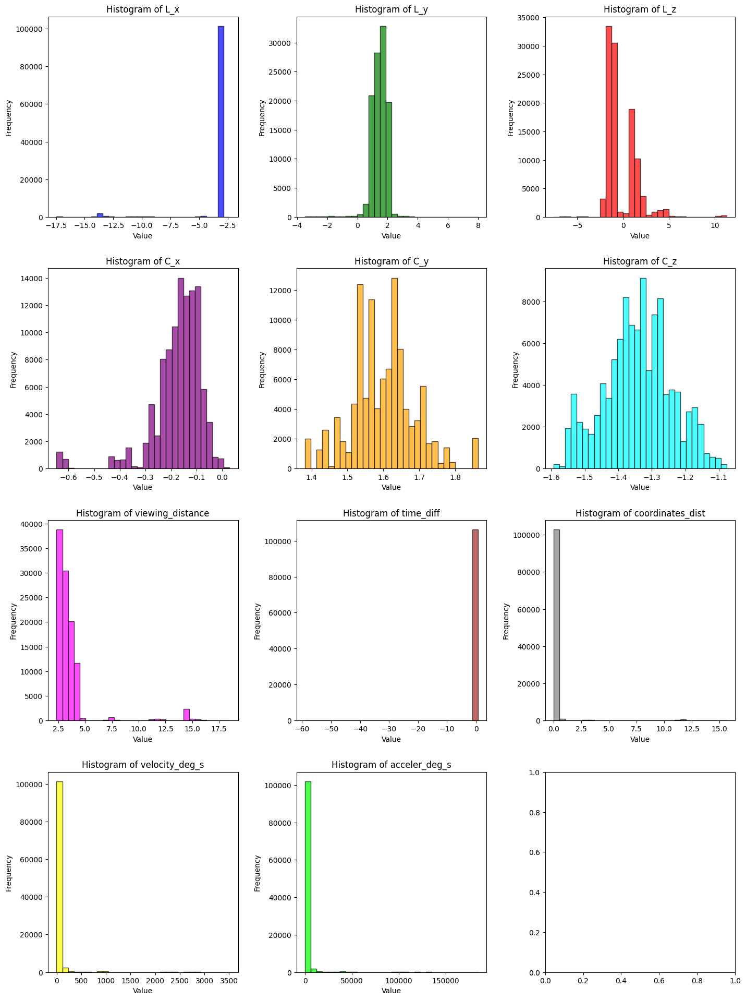

In [9]:
import matplotlib.pyplot as plt

# Define the columns to plot
columns = ['L_x', 'L_y', 'L_z', 'C_x', 'C_y', 'C_z',
           'viewing_distance', 'time_diff', 'coordinates_dist',
            'velocity_deg_s', 'acceler_deg_s']

# Define colors for consistency
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan',
          'magenta', 'brown',  'gray', 'yellow', 'lime']

# Create a 4x3 grid of subplots
fig, axes = plt.subplots(4, 3, figsize=(15, 20))  # Adjust the figure size as needed
fig.tight_layout(pad=5.0)  # Adjust the spacing between subplots

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each column and create a histogram in the corresponding subplot
for i, (column, color) in enumerate(zip(columns, colors)):
    axes[i].hist(eye_tracking_data[column], bins=30, alpha=0.7, color=color, edgecolor='black')

    # Titles and labels
    axes[i].set_title(f'Histogram of {column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Show the plot
plt.show()

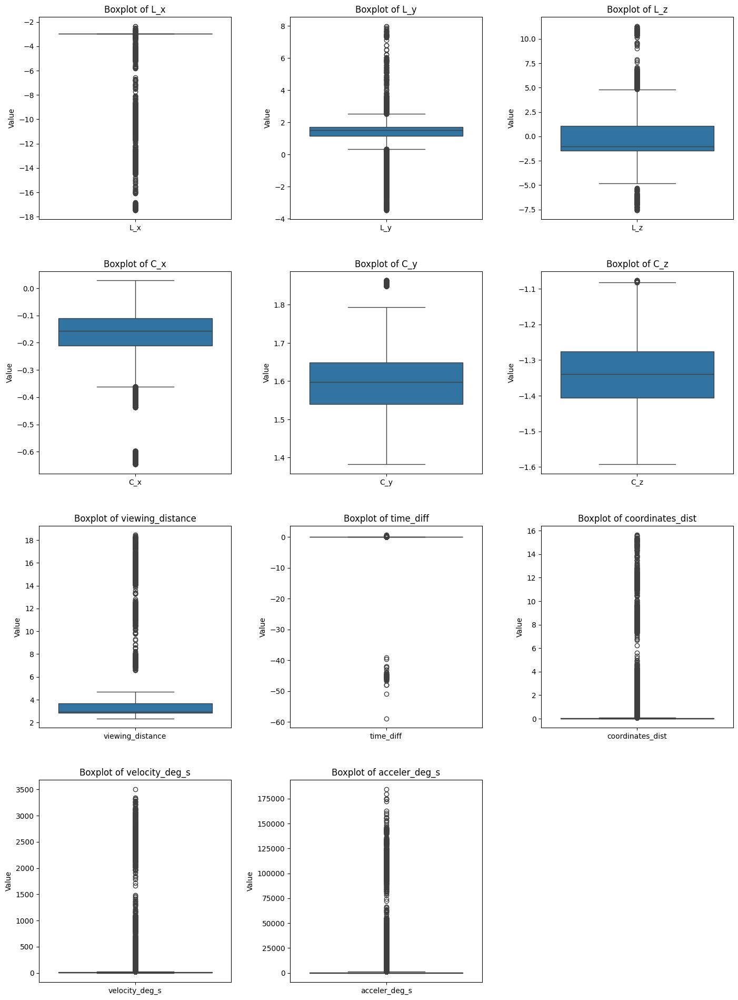

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the columns to plot
columns = ['L_x', 'L_y', 'L_z', 'C_x', 'C_y', 'C_z',
           'viewing_distance', 'time_diff', 'coordinates_dist',
           'velocity_deg_s', 'acceler_deg_s']

# Create a 4x3 grid of subplots
fig, axes = plt.subplots(4, 3, figsize=(15, 20))
fig.tight_layout(pad=5.0)  # Adjust the spacing between subplots

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each column and create a boxplot in the corresponding subplot
for i, column in enumerate(columns):
    sns.boxplot(data=eye_tracking_data[[column]], ax=axes[i])  # Use the current subplot
    axes[i].set_title(f'Boxplot of {column}')  # Set the title
    axes[i].set_xlabel('')  # Remove x-axis label (optional)
    axes[i].set_ylabel('Value')  # Set y-axis label

# Hide any unused subplots (if there are fewer than 12 columns)
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Show the plot
plt.show()

# Creating "time_diff column" for each GT

In [11]:
et_data_with_each_GT_list = []
# Loop through GT1 to GT7
for i in range(1, 8):
    # Drop columns GT2 to GT7 except the current GT column
    cols_to_drop = [f'GT{j}' for j in range(1, 8) if j != i]
    eye_tracking_data_with_GT = eye_tracking_data_no_out.drop(columns=cols_to_drop)

    if "time_diff" not in eye_tracking_data_with_GT.columns:
        eye_tracking_data_with_GT["time_diff"] = eye_tracking_data_with_GT["time"].diff().fillna(0)
        eye_tracking_data_with_GT["time_diff"] = pd.to_numeric(eye_tracking_data_with_GT["time_diff"], errors='coerce')

    # Append the resulting DataFrame to the list
    et_data_with_each_GT_list.append(eye_tracking_data_with_GT)

# et_data_with_each_GT_list contains 7 dfs with each GT


In [12]:
#first rows of the df with GT7:
et_data_with_each_GT_list[6].head(2)

,time,L_x,L_y,L_z,C_x,C_y,C_z,viewing_distance,time_diff,coordinates_dist,velocity_deg_s,acceler_deg_s,observer,GT7
0,9.337,-2.969,1.6255,-1.2432,-0.4007,1.629,-1.294,2.5688,0.023,0.0023,1.115225,48.488023,1,0
1,9.360,-2.969,1.6260,-1.2447,-0.4006,1.629,-1.294,2.5689,0.023,0.0016,0.775778,33.729487,1,0


In [13]:
et_data_with_each_GT_list[6].shape

(90408, 14)

# Features

In [14]:
features_et_data_without_GTs = []

for i in range(1, 8):
    df = et_data_with_each_GT_list[i-1].dropna().drop(columns=[f'GT{i}'])
    features_et_data_without_GTs.append(df)



#irst rows of the df without GT7:
features_et_data_without_GTs[6].head(2)

,time,L_x,L_y,L_z,C_x,C_y,C_z,viewing_distance,time_diff,coordinates_dist,velocity_deg_s,acceler_deg_s,observer
0,9.337,-2.969,1.6255,-1.2432,-0.4007,1.629,-1.294,2.5688,0.023,0.0023,1.115225,48.488023,1
1,9.360,-2.969,1.6260,-1.2447,-0.4006,1.629,-1.294,2.5689,0.023,0.0016,0.775778,33.729487,1


In [46]:
features_et_data_without_GTs[6].shape

(90408, 13)

In [16]:
# X train and X test without GTs

# Convert columns to float32 for compatibility with PyTorch

features_et_data_without_GTs[0] = features_et_data_without_GTs[0].astype('float32')
train_split = 0.75

# Creating data indices for training and test splits: source: LSTM autoencoder time series https://github.com/fabiozappo/LSTM-Autoencoder-Time-Series/blob/main/code/main.py
dataset_size = len(features_et_data_without_GTs[0])
indices = list(range(dataset_size))
split = int(np.floor(train_split * dataset_size))

#can use only one element of the list because they are all the same (only the GTs are different)
et_train_without_GT1= features_et_data_without_GTs[0].iloc[:split, :]
et_test_without_GT1 = features_et_data_without_GTs[0].iloc[split:, :]

print("et_train_without_GT1 shape:", et_train_without_GT1.shape)
print("et_test_without_GT1 shape:", et_test_without_GT1.shape)



et_train_without_GT1 shape: (67806, 13)
et_test_without_GT1 shape: (22602, 13)


# Label - GT1

In [17]:
gt_et_train_list = []
gt_et_test_list = []
train_split = 0.75


for i in range(1, 8):

    gt_column = et_data_with_each_GT_list[i-1][[f'GT{i}']]

    # Convert to float32
    gt_column = gt_column.astype('float32')

    dataset_size = len(gt_column)
    split = int(np.floor(train_split * dataset_size))

    gt_et_train_list.append(gt_column.iloc[:split, :])
    gt_et_test_list.append(gt_column.iloc[split:, :])

# for idx, (train_df, test_df) in enumerate(zip(et_train_list, et_test_list)):
#     print(f"Training DataFrame for GT{idx+1}:")
#     print(train_df.head(3), "\n")
#     print(f"Testing DataFrame for GT{idx+1}:")
#     print(test_df.head(3), "\n")

In [47]:
et_data_with_each_GT_list[0].shape

(90408, 14)

In [18]:
print("gt_et_train_GT1 shape:", gt_et_train_list[0].shape)
print("gt_et_test_GT1 shape:", gt_et_test_list[0].shape)

gt_et_train_GT1 shape: (67806, 1)
gt_et_test_GT1 shape: (22602, 1)


# Create overlapping data

In [19]:
# create overlapping data:

def subset_training_data_overlap_by_rows(
    training_data_overlap: pd.DataFrame, rows_interval: int = 460, rows_overlap: int = 135
) -> pd.DataFrame:
    """
    Splits the training_data DataFrame into overlapping subsets for each observer, using row-based intervals.
    Parameters: training_data_overlap (pd.DataFrame): The input DataFrame with an 'observer' column.
                rows_interval (int): The number of rows for each subset.
                rows_overlap (int): The number of overlapping rows for the next subset.
    Returns: pd.DataFrame: A new DataFrame with repeated overlapping rows for each observer, using global subset IDs.
    """
    # Ensure the data is sorted by observer and time
    training_data_overlap = training_data_overlap.sort_values(by=["observer", "time"]).reset_index(drop=True)

    all_subsets = []
    global_subset_id = 1

    # Iterate over each observer
    for observer_id, observer_data in training_data_overlap.groupby("observer"):
        observer_data = observer_data.reset_index(drop=True)

        # Calculate the step for each subset
        subset_step = rows_interval - rows_overlap
        n_rows = len(observer_data)

        # Create subsets using slicing
        for start_idx in range(0, n_rows, subset_step):
            end_idx = start_idx + rows_interval
            current_subset = observer_data.iloc[start_idx:end_idx].copy()

            if not current_subset.empty:
                # Label this subset with a unique global subset ID
                current_subset["subset"] = global_subset_id
                all_subsets.append(current_subset)
                global_subset_id += 1

    # Concatenate all subsets into one DataFrame
    df = pd.concat(all_subsets, ignore_index=True)
    return df

# Features with overlapping  - (the test data will not be overlaped)

Test data willl not be overlaped, therefore we need to split the data before doing the overlapping

In [20]:
### REMOVE GT1, SPLIT TRAIN/TEST, than overlap: et_train_without_GT1 (can use only this one because the features of all GTs are the same)

### OVERLAP TRAINING DATA AND CONVERT OVERLAP TRAIN AND TEST TO FLOAT

# et_train_without_GT1_overlap = subset_training_data_overlap_by_rows(et_train_without_GT1_norm)
et_train_without_GT1_overlap = subset_training_data_overlap_by_rows(et_train_without_GT1)
print(f"et_train_without_GT1_overlap shape is: {et_train_without_GT1_overlap.shape}")

### DONT OVERLAP TEST DATA TO TRAIN AUTOENCODER
# et_test_without_GT1_no_overlap = et_test_without_GT1_norm.copy() #normalized
et_test_without_GT1_no_overlap = et_test_without_GT1.copy()
print(f"et_test_without_GT1_no_overlap shape is: {et_test_without_GT1_no_overlap.shape}")
et_test_without_GT1_no_overlap = et_test_without_GT1_no_overlap.astype('float32')
# et_test_without_GT1_overlap = subset_training_data_overlap_by_rows(et_test_without_GT1)

# Convert all columns to float32 for compatibility with PyTorch
et_train_without_GT1_overlap = et_train_without_GT1_overlap.astype('float32')



et_train_without_GT1_overlap shape is: (92450, 14)
et_test_without_GT1_no_overlap shape is: (22602, 13)


In [21]:
et_test_without_GT1_no_overlap.head(3)

,time,L_x,L_y,L_z,C_x,C_y,C_z,viewing_distance,time_diff,coordinates_dist,velocity_deg_s,acceler_deg_s,observer
80117,44.875000,-2.969,2.1552,2.0557,-0.1322,1.3919,-1.4998,4.6121,0.022,0.0041,1.157591,52.617764,40.0
80126,45.118000,-2.969,1.9421,1.4636,-0.1348,1.3926,-1.4994,4.1369,0.023,0.0689,20.744308,901.926453,40.0
80127,45.140999,-2.969,1.9485,1.5052,-0.1349,1.3927,-1.4994,4.1676,0.023,0.0421,12.582217,547.052917,40.0


In [23]:
et_train_without_GT1_overlap = et_train_without_GT1_overlap.drop(columns=['subset', 'observer', 'time'])
et_test_without_GT1_no_overlap = et_test_without_GT1_no_overlap.drop(columns=['observer', 'time'])


In [24]:
et_train_without_GT1_overlap.head(3)

,L_x,L_y,L_z,C_x,C_y,C_z,viewing_distance,time_diff,coordinates_dist,velocity_deg_s,acceler_deg_s
0,-2.969,1.6255,-1.2432,-0.4007,1.6290,-1.2940,2.5688,0.023,0.0023,1.115224,48.488022
1,-2.969,1.6260,-1.2447,-0.4006,1.6290,-1.2940,2.5689,0.023,0.0016,0.775778,33.729488
2,-2.969,1.6232,-1.2430,-0.4004,1.6291,-1.2941,2.5691,0.021,0.0033,1.752291,83.442429


In [25]:
et_train_without_GT1.columns

Index(['time', 'L_x', 'L_y', 'L_z', 'C_x', 'C_y', 'C_z', 'viewing_distance',
       'time_diff', 'coordinates_dist', 'velocity_deg_s', 'acceler_deg_s',
       'observer'],
      dtype='object')

# Cleaning

In [ ]:
# eye_tracking_data_no_coord = eye_tracking_data.drop(columns= "velocity_deg_s", "acceler_deg_s", "viewing_distance")

# Overlapping the Label GT1 - Y TRAIN -
###(Need to overlap the dataset before separating the features and labels because of the column "observer", used in the function:  subset_training_data_overlap_by_rows)

In [26]:
eye_tracking_data.columns

Index(['time', 'L_x', 'L_y', 'L_z', 'C_x', 'C_y', 'C_z', 'viewing_distance',
       'time_diff', 'coordinates_dist', 'velocity_deg_s', 'acceler_deg_s',
       'observer', 'GT1', 'GT2', 'GT3', 'GT4', 'GT5', 'GT6', 'GT7'],
      dtype='object')

In [27]:
# eye_tracking_data = eye_tracking_data.drop(columns="coordinates")

In [54]:
## SPLIT TRAIN/TEST, than overlap: et_train_GT1

# Convert all columns to float32 for compatibility with PyTorch
eye_tracking_data_complete = eye_tracking_data_no_out.astype('float32') # data dropped outliers

train_split = 0.75
dataset_size = len(eye_tracking_data_complete)
indices = list(range(dataset_size))
split = int(np.floor(train_split * dataset_size))

et_train_complete = eye_tracking_data_complete.iloc[:split, :]
# et_test_GT1 = eye_tracking_data_GT1.iloc[split:, :]

### OVERLAP COMPLETE DATA - NOT POSSIBLE ONLY GT1 BECAUSE THERE IS NO OBSERVER COLUMN

et_train_complete_overlap = subset_training_data_overlap_by_rows(et_train_complete)
print(f"et_train_complete_overlap shape is: {et_train_complete_overlap.shape}\n")
print(et_train_complete_overlap.head(3))

### then REMOVE FEATUES


et_train_complete_overlap shape is: (92450, 21)

    time    L_x     L_y     L_z     C_x     C_y     C_z  viewing_distance  \
0  9.337 -2.969  1.6255 -1.2432 -0.4007  1.6290 -1.2940            2.5688   
1  9.360 -2.969  1.6260 -1.2447 -0.4006  1.6290 -1.2940            2.5689   
2  9.381 -2.969  1.6232 -1.2430 -0.4004  1.6291 -1.2941            2.5691   

   time_diff  coordinates_dist  ...  acceler_deg_s  observer  GT1  GT2  GT3  \
0      0.023            0.0023  ...      48.488022       1.0  0.0  0.0  0.0   
1      0.023            0.0016  ...      33.729488       1.0  0.0  0.0  0.0   
2      0.021            0.0033  ...      83.442429       1.0  0.0  0.0  0.0   

   GT4  GT5  GT6  GT7  subset  
0  0.0  0.0  0.0  0.0       1  
1  0.0  0.0  0.0  0.0       1  
2  0.0  0.0  0.0  0.0       1  

[3 rows x 21 columns]


In [55]:
# Create a dictionary to store the resulting DataFrames with GT columns
gt_cols_dict_train_overlap = {}

# Extract each GT column and assign to a new variable in the dictionary
for i in range(1, 8):
    gt_column = et_train_complete_overlap[[f'GT{i}']]
    gt_cols_dict_train_overlap[f'et_train_GT{i}_overlap'] = gt_column


In [56]:
gt_cols_dict_train_overlap['et_train_GT1_overlap'].shape

(92450, 1)

In [30]:
# # the train data is the same, so it can be done with only GT1

# et_train_GT1_overlap = et_train_complete_overlap[['GT1']]

# print(f"et_train_GT1_overlap shape is: {et_train_GT1_overlap.shape}\n")

# Data Normalization

In [57]:
## DATA NORMALIZATION

# Good practice to keep original dataframes untouched for reusability https://www.datacamp.com/tutorial/normalization-in-machine-learning?utm_source=google&utm_medium=paid_search&utm_campaignid=19589720821&utm_adgroupid=157156374951&utm_device=c&utm_keyword=&utm_matchtype=&utm_network=g&utm_adpostion=&utm_creative=684592139651&utm_targetid=aud-1940143831083:dsa-2218886984380&utm_loc_interest_ms=&utm_loc_physical_ms=9065007&utm_content=&utm_campaign=230119_1-sea~dsa~tofu_2-b2c_3-row-p1_4-prc_5-na_6-na_7-le_8-pdsh-go_9-nb-e_10-na_11-na&gad_source=1&gclid=Cj0KCQiApNW6BhD5ARIsACmEbkV4CiclaE8Gp-cKYV-93b7n6IT0qCIhGa9hPtTT_SHKo2qodHl_i5kaAn91EALw_wcB
## y - labels - normalization - NO NEED ITS CLASSIFICATION 0 OR 1

et_train_without_GT1_copy = et_train_without_GT1.copy()
et_test_without_GT1_copy = et_test_without_GT1.copy()

# Fit min-max scaler on training data
norm = MinMaxScaler().fit(et_train_without_GT1_overlap)

# Transform the training data
et_train_without_GT1_overlap_norm = norm.transform(et_train_without_GT1_overlap)
# et_train_without_GT1_overlap_norm = norm.transform(et_train_without_GT1)

# Use the same scaler to transform the testing set
et_test_without_GT1_no_overlap_norm = norm.transform(et_test_without_GT1_no_overlap)
#et_test_without_GT1_overlap_norm = norm.transform(et_test_without_GT1)

In [58]:
# in the training data the max value is bigger than 1, even after normalization

# Check min and max values for the normalized training data
train_min = np.min(et_train_without_GT1_overlap_norm)
train_max = np.max(et_train_without_GT1_overlap_norm)

print(f"Training Data - Min value: {train_min}, Max value: {train_max}")

# Check min and max values for the normalized testing data
test_min = np.min(et_test_without_GT1_no_overlap_norm)
test_max = np.max(et_test_without_GT1_no_overlap_norm)

print(f"Testing Data - Min value: {test_min}, Max value: {test_max}")

Training Data - Min value: 0.0, Max value: 1.000000238418579
Testing Data - Min value: -2.372264862060547e-05, Max value: 1.0072435140609741


In [59]:
# Clip the values to ensure they are within the range [0, 1]
et_train_without_GT1_overlap_norm = np.clip(et_train_without_GT1_overlap_norm, 0, 1)
et_test_without_GT1_no_overlap_norm = np.clip(et_test_without_GT1_no_overlap_norm, 0, 1)

# Check the min and max values of the normalized data
train_min, train_max = et_train_without_GT1_overlap_norm.min(), et_train_without_GT1_overlap_norm.max()
test_min, test_max = et_test_without_GT1_no_overlap_norm.min(), et_test_without_GT1_no_overlap_norm.max()

print(f"Training Data - Min value: {train_min}, Max value: {train_max}")
print(f"Testing Data - Min value: {test_min}, Max value: {test_max}")

Training Data - Min value: 0.0, Max value: 1.0
Testing Data - Min value: 0.0, Max value: 1.0


In [60]:
et_train_without_GT1_overlap_norm.shape

#et_train_without_GT1_overlap.head(3)

(92450, 11)

In [61]:
print("et_train_without_GT1_overlap_norm shape is:", et_train_without_GT1_overlap_norm.shape)
print("et_test_without_GT1_no_overlap_norm shape is:", et_test_without_GT1_no_overlap_norm.shape)

et_train_without_GT1_overlap_norm shape is: (92450, 11)
et_test_without_GT1_no_overlap_norm shape is: (22602, 11)


In [62]:
et_train_without_GT1_overlap_norm

array([[0.        , 0.6409903 , 0.20585307, ..., 0.01924686, 0.02521382,
        0.02451557],
       [0.        , 0.641303  , 0.20549676, ..., 0.01338912, 0.01753937,
        0.01705365],
       [0.        , 0.6395523 , 0.20590055, ..., 0.02761506, 0.03961709,
        0.04218854],
       ...,
       [0.        , 0.91403025, 0.9906885 , ..., 0.96569043, 0.70587313,
        0.6863253 ],
       [0.        , 0.9371639 , 0.9697136 , ..., 0.25104603, 0.18608227,
        0.18092906],
       [0.        , 0.9261597 , 0.9493564 , ..., 0.7322176 , 0.5510017 ,
        0.5357428 ]], dtype=float32)

In [63]:
et_test_without_GT1_no_overlap_norm

array([[0.        , 0.97217697, 0.98947704, ..., 0.03430963, 0.02617167,
        0.02660357],
       [0.        , 0.8389396 , 0.84882903, ..., 0.576569  , 0.4690027 ,
        0.45601454],
       [0.        , 0.8429411 , 0.85871077, ..., 0.35230127, 0.28446808,
        0.2765903 ],
       ...,
       [0.        , 0.32549703, 0.70464164, ..., 0.01589958, 0.01503039,
        0.01527843],
       [0.        , 0.32881075, 0.70240873, ..., 0.09037658, 0.08558302,
        0.08699536],
       [0.        , 0.33006126, 0.70248   , ..., 0.0167364 , 0.01515964,
        0.01473983]], dtype=float32)

# FEATURES OVERLAPPED IN THE **ENCODER**

## Using label this time instead of x_copy

In [64]:
# Convert the df to PyTorch tensor
def convert_to_tensor(data, dtype=torch.float32):
    if hasattr(data, 'values'):
      data_to_convert = data.values
    else:
      data_to_convert = data

    return torch.tensor(data_to_convert, dtype=dtype)

# # Convert the df to PyTorch tensor
# def convert_to_tensor(dataframe, dtype=torch.float32):
#     return torch.tensor(dataframe.values, dtype=dtype)


In [65]:
#Using label this time instead of x_copy

X_train_tensor = convert_to_tensor(et_train_without_GT1_overlap_norm) #normalized data in the autoencoder1
# y_train_tensor = convert_to_tensor(et_train_GT1_overlap) # using GT1 to GT7
X_test_tensor = convert_to_tensor(et_test_without_GT1_no_overlap_norm)
# y_test_tensor = convert_to_tensor(et_test_GT1) # using GT1 to GT7

#### NO NEED OF LABELS FOR THE AUTOENCODEDRS!!

print(f"X_train_tensor shape: {X_train_tensor.shape}")
# print(f"y_train_tensor shape: {y_train_tensor.shape}\n")
print(f"X_test_tensor shape: {X_test_tensor.shape}")
# print(f"y_test_tensor shape: {y_test_tensor.shape}")

X_train_tensor shape: torch.Size([92450, 11])
X_test_tensor shape: torch.Size([22602, 11])


In [66]:
# Create a dictionary to store the resulting tensors
y_train_tensors = {}

# Convert each training GT df to a tensor
for key, df in gt_cols_dict_train_overlap.items():
    y_train_tensors[key] = convert_to_tensor(df)

# Print the shape of each resulting tensor for verification
for key, tensor in y_train_tensors.items():
    print(f"{key} tensor shape is: {tensor.shape}\n")

et_train_GT1_overlap tensor shape is: torch.Size([92450, 1])

et_train_GT2_overlap tensor shape is: torch.Size([92450, 1])

et_train_GT3_overlap tensor shape is: torch.Size([92450, 1])

et_train_GT4_overlap tensor shape is: torch.Size([92450, 1])

et_train_GT5_overlap tensor shape is: torch.Size([92450, 1])

et_train_GT6_overlap tensor shape is: torch.Size([92450, 1])

et_train_GT7_overlap tensor shape is: torch.Size([92450, 1])



In [67]:
# Create a dictionary to store the resulting tensors
y_test_tensors = {}

# Convert each test GT df to a tensor using the provided function
for i, df in enumerate(gt_et_test_list):
    y_test_tensors[f"GT{i + 1}"] = convert_to_tensor(df)

# Print the shape of each resulting tensor for verification
for key, tensor in y_test_tensors.items():
    print(f"{key} tensor shape is: {tensor.shape}\n")

GT1 tensor shape is: torch.Size([22602, 1])

GT2 tensor shape is: torch.Size([22602, 1])

GT3 tensor shape is: torch.Size([22602, 1])

GT4 tensor shape is: torch.Size([22602, 1])

GT5 tensor shape is: torch.Size([22602, 1])

GT6 tensor shape is: torch.Size([22602, 1])

GT7 tensor shape is: torch.Size([22602, 1])



In [68]:
y_train_tensors['et_train_GT1_overlap']

tensor([[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]])

In [69]:
y_test_tensors["GT1"]

tensor([[0.],
        [0.],
        [0.],
        ...,
        [1.],
        [1.],
        [1.]])

In [70]:

# from torch.utils.data import TensorDataset, DataLoader

# Create a dictionary to store datasets and dataloaders for each GT
train_datasets = {}
test_datasets = {}
train_loaders = {}
test_loaders = {}

batch_size = 256

for i in range(1, 8):

    train_key = f'et_train_GT{i}_overlap'
    test_key = f'GT{i}'

    train_datasets[train_key] = TensorDataset(X_train_tensor, y_train_tensors[train_key])

    # test_datasets[test_key] = TensorDataset(X_test_tensor, y_test_tensors[test_key])
    min_size = min(X_test_tensor.shape[0], y_test_tensors[test_key].shape[0])
    X_test_trimmed = X_test_tensor[:min_size]
    y_test_trimmed = y_test_tensors[test_key][:min_size]

    test_datasets[test_key] = TensorDataset(X_test_trimmed, y_test_trimmed)



    train_loaders[train_key] = DataLoader(
        train_datasets[train_key],
        batch_size=batch_size,
        shuffle=False,  # Timeseries data: shuffle = False
        drop_last=True
    )
    test_loaders[test_key] = DataLoader(
        test_datasets[test_key],
        batch_size=batch_size,
        shuffle=False,  # Timeseries data: shuffle = False
        drop_last=True
    )

In [71]:
for i in range(1, 8):
    train_key = f'et_train_GT{i}_overlap'
    test_key = f'GT{i}'

    print(f"GT{i} - Train Dataset:")
    print(f"X_train_tensor shape: {X_train_tensor.shape}")
    print(f"y_train_tensor shape: {y_train_tensors[train_key].shape}\n")

    print(f"GT{i} - Test Dataset:")
    print(f"X_test_tensor shape: {X_test_tensor.shape}")
    print(f"y_test_tensor shape: {y_test_tensors[test_key].shape}\n")

GT1 - Train Dataset:
X_train_tensor shape: torch.Size([92450, 11])
y_train_tensor shape: torch.Size([92450, 1])

GT1 - Test Dataset:
X_test_tensor shape: torch.Size([22602, 11])
y_test_tensor shape: torch.Size([22602, 1])

GT2 - Train Dataset:
X_train_tensor shape: torch.Size([92450, 11])
y_train_tensor shape: torch.Size([92450, 1])

GT2 - Test Dataset:
X_test_tensor shape: torch.Size([22602, 11])
y_test_tensor shape: torch.Size([22602, 1])

GT3 - Train Dataset:
X_train_tensor shape: torch.Size([92450, 11])
y_train_tensor shape: torch.Size([92450, 1])

GT3 - Test Dataset:
X_test_tensor shape: torch.Size([22602, 11])
y_test_tensor shape: torch.Size([22602, 1])

GT4 - Train Dataset:
X_train_tensor shape: torch.Size([92450, 11])
y_train_tensor shape: torch.Size([92450, 1])

GT4 - Test Dataset:
X_test_tensor shape: torch.Size([22602, 11])
y_test_tensor shape: torch.Size([22602, 1])

GT5 - Train Dataset:
X_train_tensor shape: torch.Size([92450, 11])
y_train_tensor shape: torch.Size([92450, 

In [72]:
print(f"train_loaders (does not have shape): {train_loaders}")
print(f"test_loaders shape: {test_loaders}")

train_loaders (does not have shape): {'et_train_GT1_overlap': <torch.utils.data.dataloader.DataLoader object at 0x785f82b813d0>, 'et_train_GT2_overlap': <torch.utils.data.dataloader.DataLoader object at 0x785f8b539310>, 'et_train_GT3_overlap': <torch.utils.data.dataloader.DataLoader object at 0x785f8bd54650>, 'et_train_GT4_overlap': <torch.utils.data.dataloader.DataLoader object at 0x785f8bd54990>, 'et_train_GT5_overlap': <torch.utils.data.dataloader.DataLoader object at 0x785f8bd56010>, 'et_train_GT6_overlap': <torch.utils.data.dataloader.DataLoader object at 0x785f8bd57910>, 'et_train_GT7_overlap': <torch.utils.data.dataloader.DataLoader object at 0x785f8bd57850>}
test_loaders shape: {'GT1': <torch.utils.data.dataloader.DataLoader object at 0x785f8bd38250>, 'GT2': <torch.utils.data.dataloader.DataLoader object at 0x785f82afadd0>, 'GT3': <torch.utils.data.dataloader.DataLoader object at 0x785f8bd561d0>, 'GT4': <torch.utils.data.dataloader.DataLoader object at 0x785f8bd556d0>, 'GT5': <

# Create overlapping data

## Creating time_diff columns for each GT dataset

In [28]:
# et_data_with_each_GT_list = []
# # Loop through GT1 to GT7
# for i in range(1, 8):
#     # Drop columns GT2 to GT7 except the current GT column
#     cols_to_drop = [f'GT{j}' for j in range(1, 8) if j != i]
#     eye_tracking_data_with_GT = eye_tracking_data_no_out.drop(columns=cols_to_drop)

#     if "time_diff" not in eye_tracking_data_with_GT.columns:
#         eye_tracking_data_with_GT["time_diff"] = eye_tracking_data_with_GT["time"].diff().fillna(0)
#         eye_tracking_data_with_GT["time_diff"] = pd.to_numeric(eye_tracking_data_with_GT["time_diff"], errors='coerce')

#     # Append the resulting DataFrame to the list
#     et_data_with_each_GT_list.append(eye_tracking_data_with_GT)

# # et_data_with_each_GT_list contains 7 dfs with each GT




In [29]:
#acessing first rows of the df with GT7:
# et_data_with_each_GT_list[6].head(2)

,time,L_x,L_y,L_z,C_x,C_y,C_z,viewing_distance,time_diff,coordinates_dist,velocity_deg_s,acceler_deg_s,observer,GT7
0,9.337,-2.969,1.6255,-1.2432,-0.4007,1.629,-1.294,2.5688,0.023,0.0023,1.115225,48.488023,1,0
1,9.360,-2.969,1.6260,-1.2447,-0.4006,1.629,-1.294,2.5689,0.023,0.0016,0.775778,33.729487,1,0


In [30]:
# et_data_with_each_GT_list[6].shape

(90408, 14)

# AUTOENCODER MODEL

In [73]:
# Hyperparameters for the autoencoder model
random_seed = 123
learning_rate = 0.005
num_epochs = 20
weight_decay = 1e-5
#Best Params: {'learning_rate': 0.005, 'num_epochs': 20, 'num_hidden_2': 3}, Best Loss: 0.0047

# Model architecture settings
input_size = X_train_tensor.shape[1]

num_hidden_2 = 3
num_hidden_1 =  round((num_hidden_2 * input_size)**(1/2)) # First layer in encoder # https://github.com/ari-dasci/S-autoencoder-case-studies/blob/dasci/R/visualization.R
  # Compressed representation layer
# num_hidden_3 = 50   # Uncomment and change value layer 2 if use 3 layers

# Define the Autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        ### ENCODER
        self.encoder_layer1 = nn.Linear(input_size, num_hidden_1)
        self.encoder_layer2 = nn.Linear(num_hidden_1, num_hidden_2)
        # self.encoder_layer3 = nn.Linear(num_hidden_2, num_hidden_3)
        # self.encoder_layer2.weight.detach().normal_(0.0, 0.1)
        # self.encoder_layer2.bias.detach().zero_()


        ### DECODER
        # self.decoder_layer1 = nn.Linear(num_hidden_3, num_hidden_2)
        self.decoder_layer1 = nn.Linear(num_hidden_2, num_hidden_1)
        self.decoder_layer2 = nn.Linear(num_hidden_1, input_size)
        # self.decoder_layer2.weight.detach().normal_(0.0, 0.1)
        # self.decoder_layer2.bias.detach().zero_()

## When using the Sigmoid or TanH functions for hidden layers, it is a good practice to use a “Xavier Normal” or “Xavier Uniform” weight
## initialization (also referred to Glorot initialization, named for Xavier Glorot) and scale input data to the range 0 to 1; -1 to 1 (e.g. the range of the
## activation function) prior to training. https://machinelearningmastery.com/choose-an-activation-function-for-deep-learning/

## How to Choose an Output Activation Function:  If there are two mutually exclusive classes (binary classification), then your output layer will have one node and
## a sigmoid activation function should be used.https://machinelearningmastery.com/choose-an-activation-function-for-deep-learning/

    def encoder(self, x):
        x = F.relu(self.encoder_layer1(x)) # 3 - relu instead of sigmoid -1, or leaky_relu, 2
        encoded = F.sigmoid(self.encoder_layer2(x))
        return encoded

    def decoder(self, encoded_x):
        x = F.leaky_relu(self.decoder_layer1(encoded_x))
        decoded = torch.sigmoid(self.decoder_layer2(x))  # Sigmoid to get values between 0 and 1
        return decoded

## if using 3 layers:

    # def encoder(self, x):
    #     x = F.sigmoid(self.encoder_layer1(x))
    #     x = F.sigmoid(self.encoder_layer2(x)) ## ADDING A 3DR LAYER
    #     encoded = F.sigmoid(self.encoder_layer3(x)) ## ADDING A 3DR LAYER
    #     return encoded

    # def decoder(self, encoded_x):
    #     x = F.sigmoid(self.decoder_layer1(encoded_x))
    #     x = F.sigmoid(self.decoder_layer2(x)) ## ADDING A 3DR LAYER
    #     decoded = torch.sigmoid(self.decoder_layer3(x))  # Sigmoid to get values between 0 and 1 ## ADDING A 3DR LAYER
    #     return decoded

    def forward(self, x):
        # Flatten input from (batch, sequence_length, features) to (batch, input_size)
        x = x.view(x.size(0), -1)
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Instantiate the model
torch.manual_seed(random_seed)
model = Autoencoder().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, weight_decay=weight_decay) # added regularization (weight decay) L2





#  Training

## Testing best hyperparameters encoder


-Best Params: {'learning_rate': 0.005, 'num_epochs': 20, 'num_hidden_2': 3}, Best Loss: 0.0047

In [171]:
import torch
import torch.nn.functional as F
import time
from sklearn.model_selection import ParameterGrid

# Define the hyperparameter grid

#Best Params: {'learning_rate': 0.005, 'num_epochs': 20, 'num_hidden_2': 3}, Best Loss: 0.0047
param_grid = {
    'learning_rate': [0.001, 0.005, 0.01],
    'num_epochs': [5, 10, 20],
    'num_hidden_2': [2, 3]
}

# Track best hyperparameters for MSE and BCE loss separately
best_mse_loss = float('inf')
best_mse_params = None

best_bce_loss = float('inf')
best_bce_params = None

# Select the first ground truth (GT1) for training
first_gt_key = list(train_loaders.keys())[0]
first_train_loader = train_loaders[first_gt_key]
first_test_loader = test_loaders["GT1"]

# Grid search loop
for params in ParameterGrid(param_grid):
    learning_rate = params['learning_rate']
    num_epochs = params['num_epochs']
    num_hidden_2 = params['num_hidden_2']

    print(f"\nTraining with params: {params}")

    # Initialize the model (without passing num_hidden_2)
    model = Autoencoder().to(device)

    # Dynamically update encoder_layer2 based on num_hidden_2
    model.encoder_layer2 = nn.Linear(model.encoder_layer1.out_features, num_hidden_2)

    # Reinitialize the optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    # Training loop
    for epoch in range(num_epochs):
        for batch_idx, (sequences, _) in enumerate(first_train_loader):
            sequences = sequences.to(device)
            decoded = model(sequences)

            # Compute loss (you can switch between MSE and BCE loss)
            loss = F.mse_loss(decoded, sequences.view(sequences.size(0), -1))  # MSE loss example
            # loss = F.binary_cross_entropy(decoded, sequences.view(sequences.size(0), -1))  # BCE loss example

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Logging
        print(f'Params: {params}, Epoch: {epoch + 1}/{num_epochs}, Loss: {loss.item():.4f}')

    # Evaluate the model on the validation set (using test data)
    val_loss = 0
    with torch.no_grad():
        for sequences, _ in first_test_loader:
            sequences = sequences.to(device)
            decoded = model(sequences)
            val_loss += F.mse_loss(decoded, sequences.view(sequences.size(0), -1)).item()

    val_loss /= len(first_test_loader)

    # Update best parameters if the current model is better
    if val_loss < best_mse_loss:
        best_mse_loss = val_loss
        best_mse_params = params

print(f'Best Params: {best_mse_params}, Best Loss: {best_mse_loss:.4f}')



Training with params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 2}
Params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 2}, Epoch: 1/5, Loss: 0.0325
Params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 2}, Epoch: 2/5, Loss: 0.0285
Params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 2}, Epoch: 3/5, Loss: 0.0281
Params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 2}, Epoch: 4/5, Loss: 0.0280
Params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 2}, Epoch: 5/5, Loss: 0.0281

Training with params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 3}
Params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 3}, Epoch: 1/5, Loss: 0.0351
Params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 3}, Epoch: 2/5, Loss: 0.0292
Params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 3}, Epoch: 3/5, Loss: 0.0283
Params: {'learning_rate': 0.001, 'num_epochs': 5, 'num_hidden_2': 3}, Ep

## Training model with best hyperparameters

In [74]:
## since for the training we are only using X values, there is no need to use the other keys

# import time

# Access the first train_loader (GT1)
first_gt_key = list(train_loaders.keys())[0]  # Get the key for the first GT
first_train_loader = train_loaders[first_gt_key]  # Access the DataLoader for the first GT

# Training Loop for the first GT
start_time = time.time()
for epoch in range(num_epochs):
    for batch_idx, (sequences, _) in enumerate(first_train_loader): # only X values ("sequences") being used
        sequences = sequences.to(device)

        # Forward pass
        decoded = model(sequences)

        # Compute loss
        # loss = F.binary_cross_entropy(decoded, sequences.view(sequences.size(0), -1), reduction='mean')
        # Alternatively, use MSE loss:
        loss = F.mse_loss(decoded, sequences.view(sequences.size(0), -1))

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Logging
        if not batch_idx % 50:
            print('Epoch: %03d/%03d | Batch %03d/%03d | Loss: %.4f'
                  % (epoch + 1, num_epochs, batch_idx, len(first_train_loader), loss))

# Print training time
print(f"Training time for {first_gt_key}: {time.time() - start_time:.2f} seconds")

Epoch: 001/020 | Batch 000/361 | Loss: 0.1319
Epoch: 001/020 | Batch 050/361 | Loss: 0.0603
Epoch: 001/020 | Batch 100/361 | Loss: 0.0500
Epoch: 001/020 | Batch 150/361 | Loss: 0.0257
Epoch: 001/020 | Batch 200/361 | Loss: 0.0178
Epoch: 001/020 | Batch 250/361 | Loss: 0.0324
Epoch: 001/020 | Batch 300/361 | Loss: 0.0338
Epoch: 001/020 | Batch 350/361 | Loss: 0.0255
Epoch: 002/020 | Batch 000/361 | Loss: 0.0567
Epoch: 002/020 | Batch 050/361 | Loss: 0.0298
Epoch: 002/020 | Batch 100/361 | Loss: 0.0342
Epoch: 002/020 | Batch 150/361 | Loss: 0.0205
Epoch: 002/020 | Batch 200/361 | Loss: 0.0152
Epoch: 002/020 | Batch 250/361 | Loss: 0.0289
Epoch: 002/020 | Batch 300/361 | Loss: 0.0320
Epoch: 002/020 | Batch 350/361 | Loss: 0.0227
Epoch: 003/020 | Batch 000/361 | Loss: 0.0536
Epoch: 003/020 | Batch 050/361 | Loss: 0.0245
Epoch: 003/020 | Batch 100/361 | Loss: 0.0287
Epoch: 003/020 | Batch 150/361 | Loss: 0.0191
Epoch: 003/020 | Batch 200/361 | Loss: 0.0136
Epoch: 003/020 | Batch 250/361 | L

In [41]:
test_loaders

{'GT1': <torch.utils.data.dataloader.DataLoader at 0x7e96593c74d0>,
 'GT2': <torch.utils.data.dataloader.DataLoader at 0x7e9659202410>,
 'GT3': <torch.utils.data.dataloader.DataLoader at 0x7e9659202b10>,
 'GT4': <torch.utils.data.dataloader.DataLoader at 0x7e9659200c10>,
 'GT5': <torch.utils.data.dataloader.DataLoader at 0x7e9659202890>,
 'GT6': <torch.utils.data.dataloader.DataLoader at 0x7e9659202990>,
 'GT7': <torch.utils.data.dataloader.DataLoader at 0x7e9659203290>}

## Evaluate model

Reconstruct X_test and check loss original and reconstructed

In [75]:
import torch.nn.functional as F

# Put model in evaluation mode
model.eval()

# Store losses for all batches
mse_losses = []
mae_losses = []

# Access the first test loader
first_test_loader = test_loaders['GT1']  # X_test is the same for all GTs  train_datasets[train_key] = TensorDataset(X_train_tensor, y_train_tensors[train_key]),

with torch.no_grad():  # No gradients needed during evaluation
    for sequences, _ in first_test_loader:  # No labels needed
        sequences = sequences.to(device)

        # Forward pass (reconstruction)
        decoded = model(sequences)

        # Compute reconstruction errors
        mse_loss = F.mse_loss(decoded, sequences.view(sequences.size(0), -1), reduction='mean').item()
        mae_loss = F.l1_loss(decoded, sequences.view(sequences.size(0), -1), reduction='mean').item()

        mse_losses.append(mse_loss)
        mae_losses.append(mae_loss)

# Compute mean loss over all batches
avg_mse = sum(mse_losses) / len(mse_losses)
avg_mae = sum(mae_losses) / len(mae_losses)

print(f"Reconstruction MSE: {avg_mse:.6f}")
print(f"Reconstruction MAE: {avg_mae:.6f}")


Reconstruction MSE: 0.012430
Reconstruction MAE: 0.073126


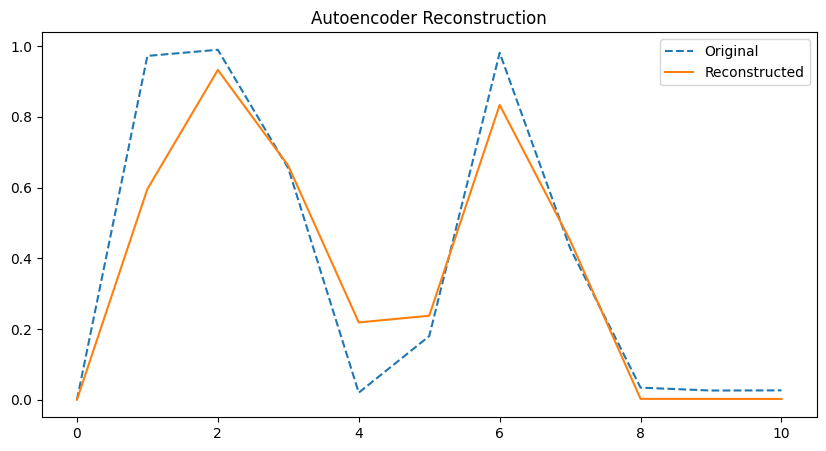

In [76]:
import matplotlib.pyplot as plt

# Select a batch
sequences, _ = next(iter(first_test_loader))
sequences = sequences.to(device)

# Get reconstruction
model.eval()
with torch.no_grad():
    decoded = model(sequences)

# Convert to NumPy for plotting
original = sequences.cpu().numpy()
reconstructed = decoded.cpu().numpy()

# Plot original vs. reconstructed
plt.figure(figsize=(10, 5))
plt.plot(original[0], label="Original", linestyle="dashed")
plt.plot(reconstructed[0], label="Reconstructed", linestyle="solid")
plt.legend()
plt.title("Autoencoder Reconstruction")
plt.show()


## Extract encoder features to use in RF model

In [77]:
# Extract bottleneck features
model.eval()
bottleneck_features = []

with torch.no_grad():
    for sequences, _ in first_test_loader:
        sequences = sequences.to(device)
        latent = model.encoder(sequences)  # use encoder to get bottleneck features
        bottleneck_features.append(latent.cpu().numpy())

In [78]:
bottleneck_train = []

model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    for sequences, _ in next(iter(train_loaders.values())):  # Use the first DataLoader
        sequences = sequences.to(device)
        latent = model.encoder(sequences)  # Extract bottleneck features
        bottleneck_train.append(latent.cpu().numpy())

# Convert list to numpy array
X_train_ae = np.vstack(bottleneck_train)  # Shape should now match y_train


In [79]:
X_train_ae.shape

(92416, 3)

In [51]:
# bottleneck_train = []

# model.eval()  # Set the model to evaluation mode
# with torch.no_grad():
#     for sequences, _ in train_loaders:  # No labels needed
#         sequences = sequences.to(device)
#         latent = model.encoder(sequences)  # Extract bottleneck features
#         bottleneck_train.append(latent.cpu().numpy())

# # Convert list to numpy array
# X_train_ae = np.vstack(bottleneck_train)  # Shape: (num_samples_train, 2)


In [80]:
bottleneck_test = []

with torch.no_grad():
    for sequences, _ in next(iter(test_loaders.values())):  # Use the first test DataLoader
        sequences = sequences.to(device)
        latent = model.encoder(sequences)  # Extract bottleneck features
        bottleneck_test.append(latent.cpu().numpy())

# Convert list to numpy array
X_test_ae = np.vstack(bottleneck_test)  # Shape should match y_test


In [81]:
X_test_ae.shape

(22528, 3)

In [50]:
# bottleneck_test = []

# with torch.no_grad():
#     for sequences, _ in test_loader:
#         sequences = sequences.to(device)
#         latent = model.encoder(sequences)  # Extract bottleneck features
#         bottleneck_test.append(latent.cpu().numpy())

# # Convert list to numpy array
# X_test_ae = np.vstack(bottleneck_test)  # Shape: (num_samples_test, 2 or 3)


In [82]:
# # Get y_train (from gt_cols_dict_train_overlap)
# y_train_rf = list(gt_cols_dict_train_overlap.values())[0].values.ravel()  #### THIS IS WITH GT1
# y_train_rf = y_train_rf[:X_train_ae.shape[0]]  # Trim labels to match features


# # # Get y_test (from gt_et_test_list)
# # y_test_rf = gt_et_test_list[0].values.ravel()  # Convert to 1D array
# # y_test_rf = y_test_rf[:X_test_ae.shape[0]]



# # Random Forest Classifier - USING OVERLAP X FROM ENCODER AND OVERLAP Y (LABELS) FOR TRAIN. USING ORIGINAL X FROM AUTOENCODER AND Y FOR TEST
# rf = RandomForestClassifier(n_estimators=50, max_depth=2, n_jobs=-1)
# rf.fit(X_train_ae_overlap, et_train_GT1_overlap.values.ravel()) # et_train_without_GT1_overlap  # #source: https://stackoverflow.com/questions/34165731/a-column-vector-y-was-passed-when-a-1d-array-was-expected

# print(f'Train Accuracy: {rf.score(X_train_ae_overlap, et_train_GT1_overlap) * 100:.2f}%') #  et_train_without_GT1_overlap
# print(f'Test Accuracy: {rf.score(X_test_ae, et_test_GT1) * 100:.2f}%') # et_test_without_GT1_no_overlap

In [57]:
# print(f'X_train_ae shape is: {X_train_ae.shape}')
# print(f'X_test_ae shape is: {X_test_ae.shape}')
# print(f'y_train_rf shape is: {y_train_rf.shape}')
# print(f'y_test_rf shape is: {y_test_rf.shape}')

X_train_ae shape is: (108800, 3)
X_test_ae shape is: (26368, 3)
y_train_rf shape is: (108800,)
y_test_rf shape is: (26368,)


In [121]:
### SELECTION OF BEST PARAMETERS FOR RANDOM FOREST MODEL


# from sklearn.model_selection import ParameterGrid
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import accuracy_score
# import numpy as np
# import pandas as pd

# # Define the parameter grid for Random Forest
# param_grid_rf = {
#     'n_estimators': [10, 50, 100, 200],
#     'max_depth': [2, 4, 8]
# }

# # Store the best parameters for each GT
# best_params_dict = {}

# for i in range(1, 8):
#     print(f"Processing GT{i}...")

#     # Define the ground truth for the current GT
#     gt_train = gt_cols_dict_train_overlap[f'et_train_GT{i}_overlap']
#     gt_test = gt_et_test_list[i - 1]

#     best_params = None
#     best_accuracy = 0

#     for params in ParameterGrid(param_grid_rf):
#         rf = RandomForestClassifier(n_estimators=params['n_estimators'], max_depth=params['max_depth'], n_jobs=-1, random_state=42)

#         # Fit the model
#         rf.fit(X_train_ae, gt_train.values.ravel()[:X_train_ae.shape[0]])

#         # Evaluate on test set
#         y_pred = rf.predict(X_test_ae)
#         gt_test_aligned = gt_test.values.ravel()[:y_pred.shape[0]]
#         test_accuracy = accuracy_score(gt_test_aligned, y_pred)

#         # Update best parameters if this configuration performs better
#         if test_accuracy > best_accuracy:
#             best_accuracy = test_accuracy
#             best_params = params

#     # Store the best parameters for this GT
#     best_params_dict[f'GT{i}'] = best_params
#     print(f"Best parameters for GT{i}: {best_params} with accuracy {best_accuracy:.4f}")

# # Print final results
# print("\nFinal Best Parameters for Each GT:")
# for gt, params in best_params_dict.items():
#     print(f"{gt}: {params}")


Processing GT1...
Best parameters for GT1: {'max_depth': 2, 'n_estimators': 50} with accuracy 0.5956
Processing GT2...
Best parameters for GT2: {'max_depth': 4, 'n_estimators': 100} with accuracy 0.5667
Processing GT3...
Best parameters for GT3: {'max_depth': 4, 'n_estimators': 10} with accuracy 0.5979
Processing GT4...
Best parameters for GT4: {'max_depth': 4, 'n_estimators': 10} with accuracy 0.5938
Processing GT5...
Best parameters for GT5: {'max_depth': 2, 'n_estimators': 10} with accuracy 0.6101
Processing GT6...
Best parameters for GT6: {'max_depth': 4, 'n_estimators': 50} with accuracy 0.6224
Processing GT7...
Best parameters for GT7: {'max_depth': 4, 'n_estimators': 10} with accuracy 0.5719

Final Best Parameters for Each GT:
GT1: {'max_depth': 2, 'n_estimators': 50}
GT2: {'max_depth': 4, 'n_estimators': 100}
GT3: {'max_depth': 4, 'n_estimators': 10}
GT4: {'max_depth': 4, 'n_estimators': 10}
GT5: {'max_depth': 2, 'n_estimators': 10}
GT6: {'max_depth': 4, 'n_estimators': 50}
GT7

## RF model metrics for each GT

In [89]:
##

from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error, mean_absolute_error
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score

# Best parameters for each GT
best_params = {
    "GT1": {"max_depth": 2, "n_estimators": 50},
    "GT2": {"max_depth": 4, "n_estimators": 100},
    "GT3": {"max_depth": 4, "n_estimators": 10},
    "GT4": {"max_depth": 4, "n_estimators": 10},
    "GT5": {"max_depth": 2, "n_estimators": 10},
    "GT6": {"max_depth": 4, "n_estimators": 50},
    "GT7": {"max_depth": 4, "n_estimators": 10},
}

# Initialize results storage
results_dict = {f'GT{i}': [] for i in range(1, 8)}

# Cross-validation and multiple runs
num_runs = 10  # Number of times we repeat training
k = 5  # Number of CV folds
kf = KFold(n_splits=k, shuffle=True, random_state=42)

for i in range(1, 8):
    gt_train = gt_cols_dict_train_overlap[f'et_train_GT{i}_overlap']
    gt_test = gt_et_test_list[i - 1]

    params = best_params[f'GT{i}']  # Use best params for this GT

    for run in range(num_runs):
        rf = RandomForestClassifier(n_estimators=params['n_estimators'], max_depth=params['max_depth'], n_jobs=-1, random_state=run)

        # Cross-validation loop
        for train_index, val_index in kf.split(X_train_ae):
            X_train_cv, X_val_cv = X_train_ae[train_index], X_train_ae[val_index]
            y_train_cv, y_val_cv = gt_train.values.ravel()[train_index], gt_train.values.ravel()[val_index]

            rf.fit(X_train_cv, y_train_cv)

        # Evaluate on full training and test sets
        train_accuracy = rf.score(X_train_ae, gt_train.values.ravel()[:X_train_ae.shape[0]])
        test_accuracy = rf.score(X_test_ae, gt_test.values.ravel()[:X_test_ae.shape[0]])

        y_pred = rf.predict(X_test_ae)
        gt_test_aligned = gt_test.values.ravel()[:y_pred.shape[0]]  # Ensure alignment

#         # Compute metrics
        precision = precision_score(gt_test_aligned, y_pred, zero_division=0)
        recall = recall_score(gt_test_aligned, y_pred, zero_division=0)
        f1 = f1_score(gt_test_aligned, y_pred, zero_division=0)
        mse = mean_squared_error(gt_test_aligned, y_pred)
        rms = np.sqrt(mse)
        mae = mean_absolute_error(gt_test_aligned, y_pred)
        std_error = np.std(np.abs(gt_test_aligned - y_pred))

        # Get predicted probabilities for the positive class (class 1 - fixation)
        y_pred_proba = rf.predict_proba(X_test_ae)[:, 1]  # [:, 1] to get the probabilities for class 1
        roc_auc = roc_auc_score(gt_test_aligned, y_pred_proba)

        # Store results
        results_dict[f'GT{i}'].append({
            'run': run,
            'train_accuracy': train_accuracy,
            'test_accuracy': test_accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1,
            'rms': rms,
            'mae': mae,
            'std_error': std_error,
            'roc_auc': roc_auc

        })

# Convert results to DataFrames
results_dfs = {f'GT{i}': pd.DataFrame(results_dict[f'GT{i}']) for i in range(1, 8)}

# Compute average metrics across all runs for each GT
average_results = {
    f'GT{i}': results_dfs[f'GT{i}'].groupby('run').mean().reset_index() for i in range(1, 8)
}

# Print average results for each GT
for i in range(1, 8):
    print(f"Average results for GT{i}:")
    print(average_results[f'GT{i}'])
    print("\n")


Average results for GT1:
   run  train_accuracy  test_accuracy  precision    recall        f1  \
0    0        0.731518       0.728560   0.709445  0.952023  0.813026   
1    1        0.731865       0.728693   0.709648  0.951736  0.813054   
2    2        0.736236       0.733754   0.714848  0.949087  0.815480   
3    3        0.734948       0.734641   0.715737  0.948729  0.815926   
4    4        0.735771       0.732244   0.713517  0.949159  0.814640   
5    5        0.735176       0.734730   0.716164  0.947655  0.815806   
6    6        0.734721       0.732333   0.713410  0.949731  0.814781   
7    7        0.735403       0.733798   0.714586  0.950018  0.815653   
8    8        0.736074       0.734775   0.716016  0.948228  0.815922   
9    9        0.735511       0.733221   0.714501  0.948729  0.815122   

        rms       mae  std_error   roc_auc  
0  0.520999  0.271440   0.444702  0.724146  
1  0.520871  0.271307   0.444634  0.725839  
2  0.515991  0.266246   0.441995  0.724709  
3 

# Metrics of the model - F1, Precision, Recall

In [90]:
# Compute global average across all GTs
global_avg_results = {}

metrics = ['train_accuracy', 'test_accuracy', 'precision', 'recall', 'f1', 'rms', 'mae', 'std_error']

for metric in metrics:
    global_avg_results[metric] = np.mean([average_results[f'GT{i}'][metric].mean() for i in range(1, 8)])


global_avg_df = pd.DataFrame([global_avg_results])

# Save to CSV
global_avg_df.to_csv("global_average_metrics.csv", index=False)

# Print global averages
print("Global Average Metrics Across GT1 to GT7:")
print(global_avg_df)


Global Average Metrics Across GT1 to GT7:
   train_accuracy  test_accuracy  precision    recall        f1      rms  \
0         0.71803       0.716685   0.701503  0.940459  0.803414  0.53211   

        mae  std_error  
0  0.283315   0.450336  


# 3 Features 3D Plot

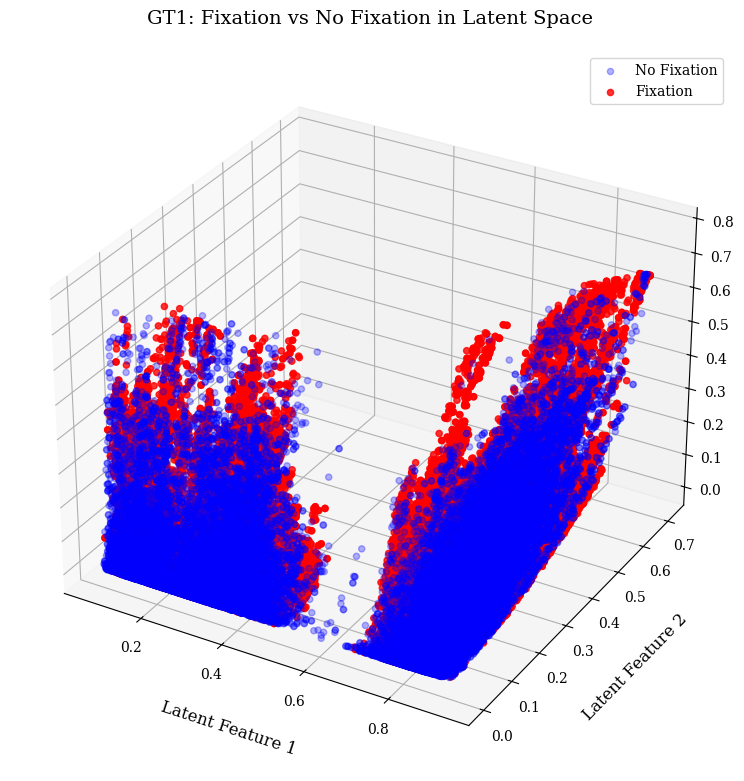

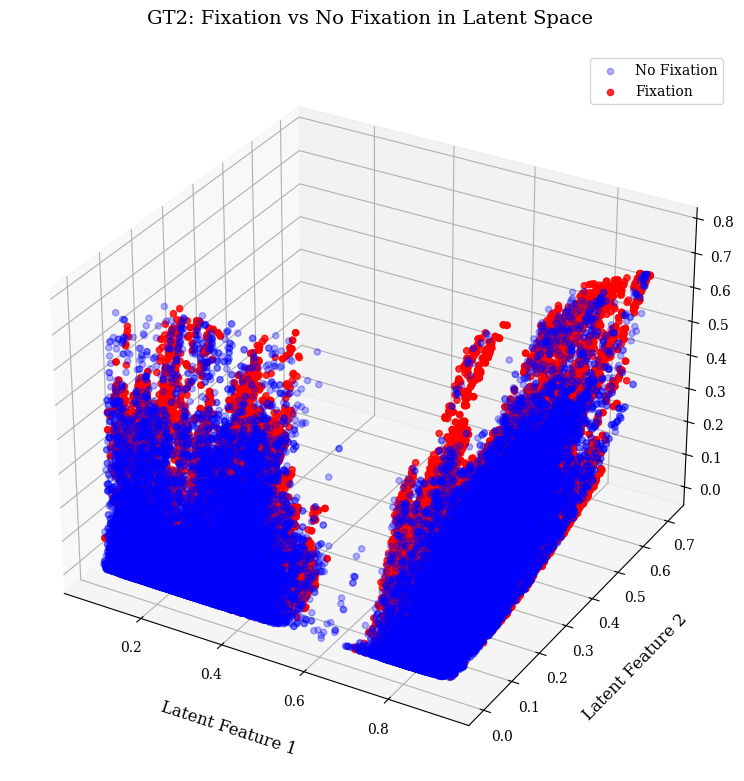

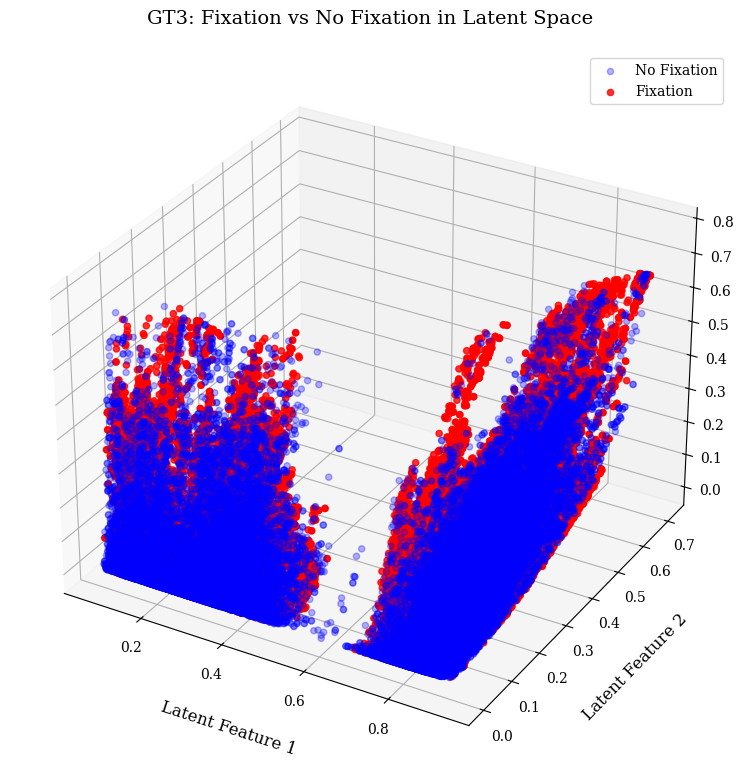

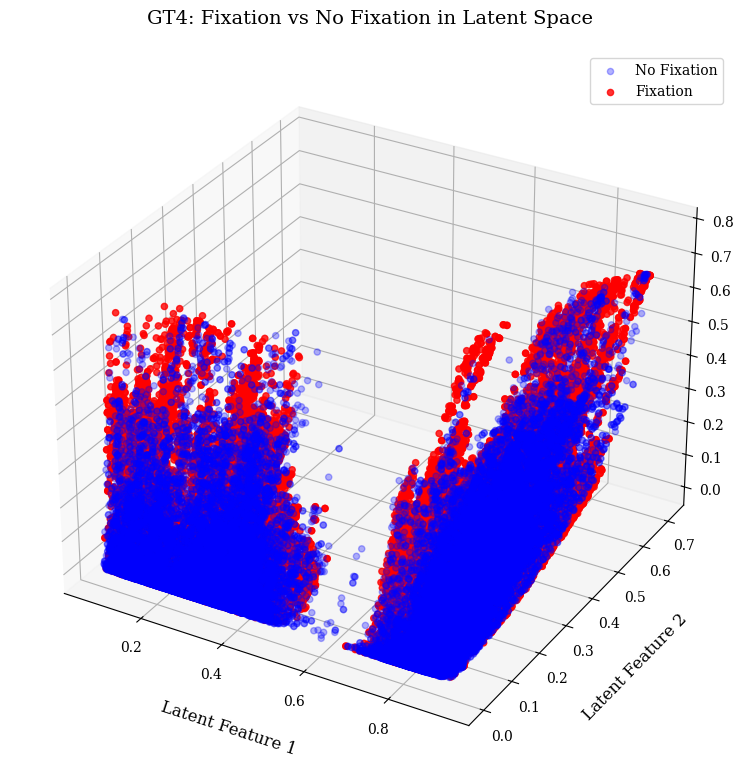

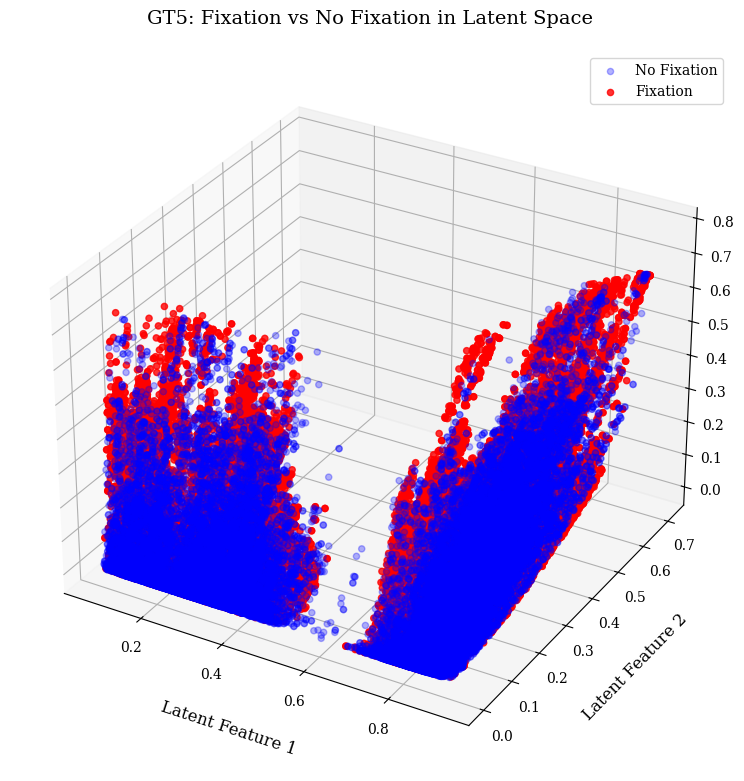

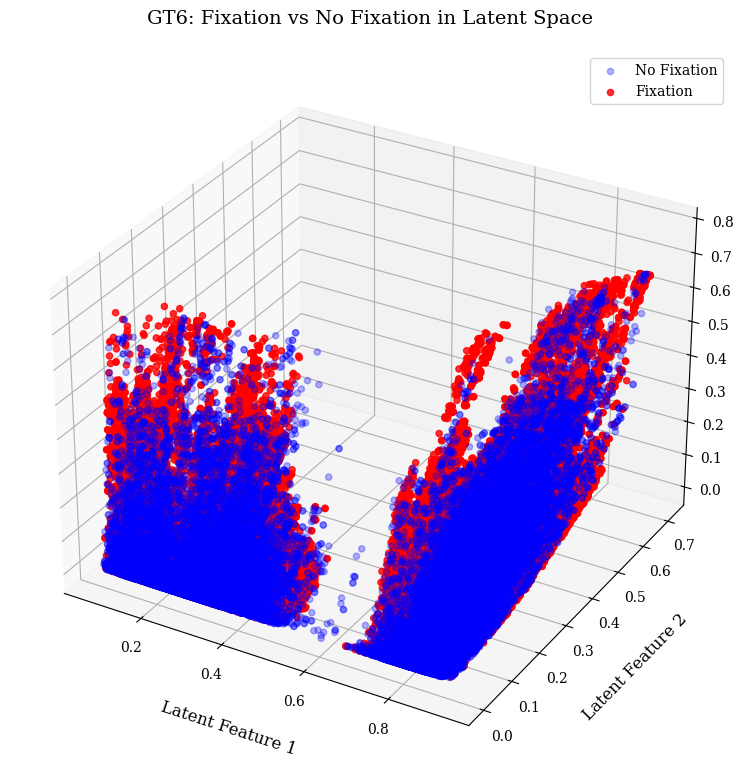

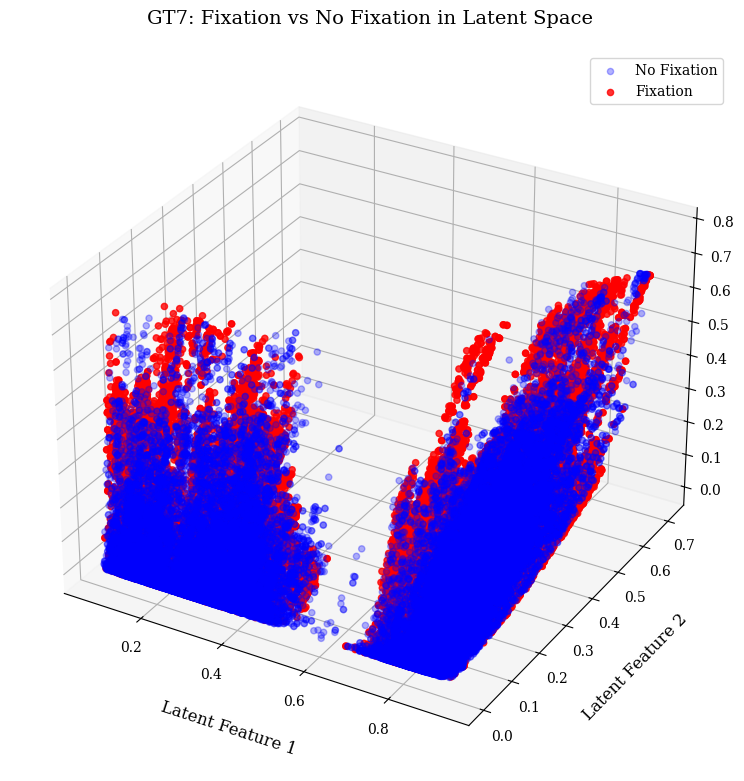

In [91]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Define font properties
plt.rcParams['font.family'] = 'serif'  # Change font to serif for better readability

# Loop through all 7 GTs
for i in range(1, 8):
    # Extract the corresponding labels for the current GT
    y_train_rf = gt_cols_dict_train_overlap[f'et_train_GT{i}_overlap'].values.ravel()
    y_train_rf = y_train_rf[:X_train_ae.shape[0]]  # Trim labels to match features

    # Extract the three latent features from the autoencoder bottleneck
    latent_feature_1 = X_train_ae[:, 0]
    latent_feature_2 = X_train_ae[:, 1]
    latent_feature_3 = X_train_ae[:, 2] #if X_train_ae.shape[1] > 2 else np.zeros_like(latent_feature_1)

    # Ground truth labels for fixation (1) and no fixation (0)
    fixation_labels = y_train_rf.flatten()  # Ensure it's a 1D array

    # Create the 3D scatter plot
    fig = plt.figure(figsize=(12, 9))  # Increased width for more space
    ax = fig.add_subplot(111, projection='3d')

    # Separate data points for fixation and no fixation
    fixation_points = fixation_labels == 1
    no_fixation_points = fixation_labels == 0

    # Plot each category with a specific color and label
    ax.scatter(latent_feature_1[no_fixation_points], latent_feature_2[no_fixation_points], latent_feature_3[no_fixation_points],
               color='blue', label='No Fixation', alpha=0.3)
    ax.scatter(latent_feature_1[fixation_points], latent_feature_2[fixation_points], latent_feature_3[fixation_points],
               color='red', label='Fixation', alpha=0.8)

    # Labels and title
    ax.set_xlabel('Latent Feature 1', fontsize=12, labelpad=15)
    ax.set_ylabel('Latent Feature 2', fontsize=12, labelpad=15)
    ax.set_zlabel('Latent Feature 3', fontsize=12, labelpad=20)
    ax.set_title(f'GT{i}: Fixation vs No Fixation in Latent Space', fontsize=14, pad=20)

    # Add legend
    ax.legend()

    # Adjust layout for better spacing
    plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9) #(left=0.12, right=0.88)  # More space on both sides

    # Show the plot
    plt.show()


In [92]:
X_train_ae

array([[0.9028746 , 0.27473906, 0.15440783],
       [0.9031123 , 0.28370202, 0.1616701 ],
       [0.90044445, 0.23664503, 0.13708547],
       ...,
       [0.8779288 , 0.53852266, 0.6638229 ],
       [0.873055  , 0.52547294, 0.65916324],
       [0.8775486 , 0.55193317, 0.67655087]], dtype=float32)

## Feature 1 x Feature 2

In [93]:
# Inverse transform to get the values back to the original range
et_train_original_values = norm.inverse_transform(et_train_without_GT1_overlap_norm)
et_test_original_values = norm.inverse_transform(et_test_without_GT1_no_overlap_norm)

# Check the values
print(f"Training Data - Min value after inverse transform: {et_train_original_values.min()}, Max value: {et_train_original_values.max()}")
print(f"Testing Data - Min value after inverse transform: {et_test_original_values.min()}, Max value: {et_test_original_values.max()}")


Training Data - Min value after inverse transform: -2.9690001010894775, Max value: 1977.8458251953125
Testing Data - Min value after inverse transform: -2.9690001010894775, Max value: 1972.248779296875


In [94]:
# Check the values
print(f"Training Data - Min value original: {et_train_without_GT1_copy.min()}, Max value: {et_train_original_values.max()}")
print(f"Testing Data - Min value original: {et_test_without_GT1_copy.min()}, Max value: {et_test_original_values.max()}")


Training Data - Min value original: time                5.2290
L_x                -2.9690
L_y                 0.6003
L_z                -2.1098
C_x                -0.4366
C_y                 1.3822
C_z                -1.5926
viewing_distance    2.5400
time_diff           0.0190
coordinates_dist    0.0000
velocity_deg_s      0.0000
acceler_deg_s       0.0000
observer            1.0000
dtype: float32, Max value: 1977.8458251953125
Testing Data - Min value original: time                 5.2510
L_x                 -2.9690
L_y                  0.6011
L_z                 -2.1099
C_x                 -0.3141
C_y                  1.3872
C_z                 -1.5657
viewing_distance     2.6756
time_diff            0.0190
coordinates_dist     0.0000
velocity_deg_s       0.0000
acceler_deg_s        0.0000
observer            40.0000
dtype: float32, Max value: 1972.248779296875


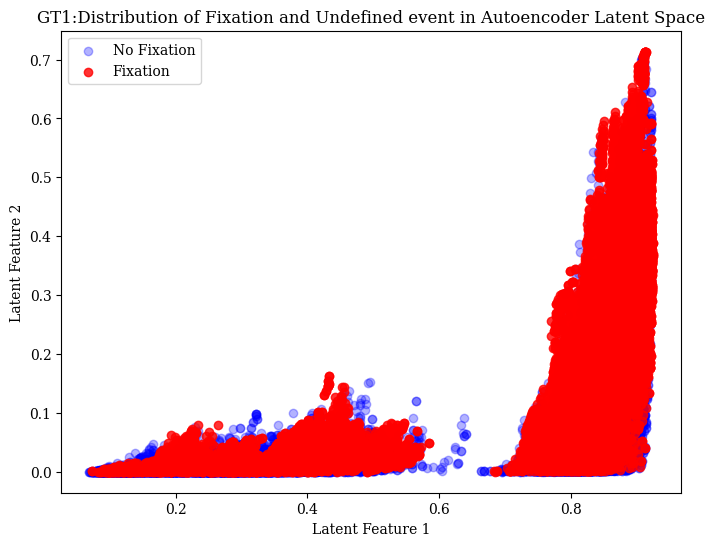

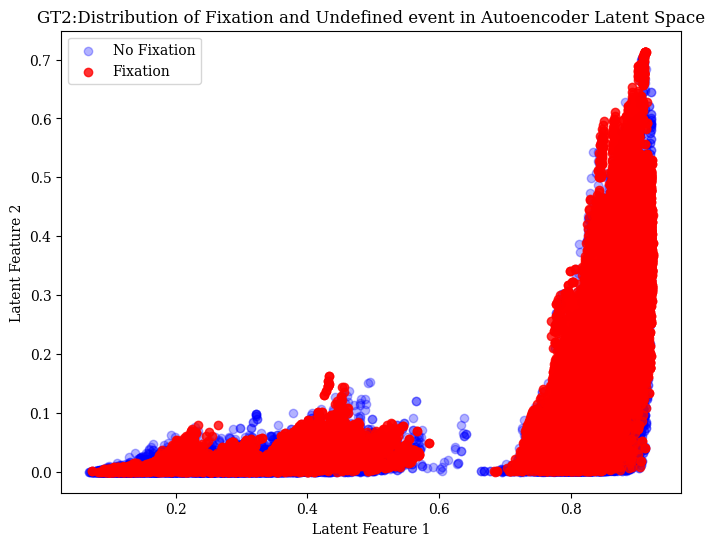

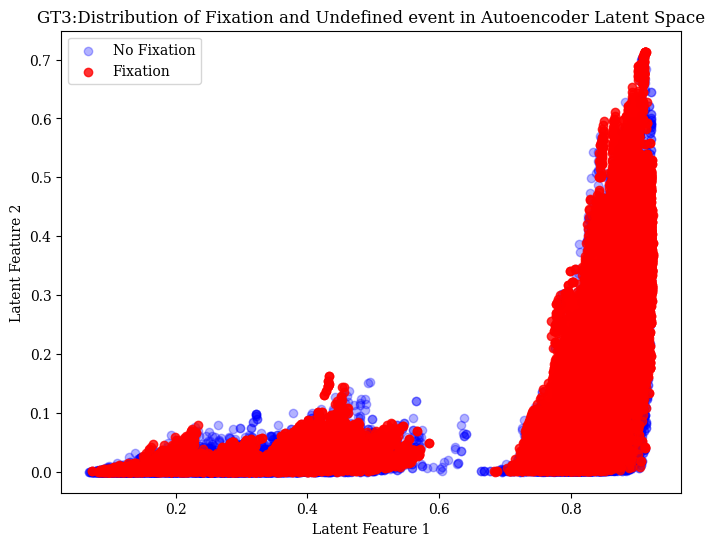

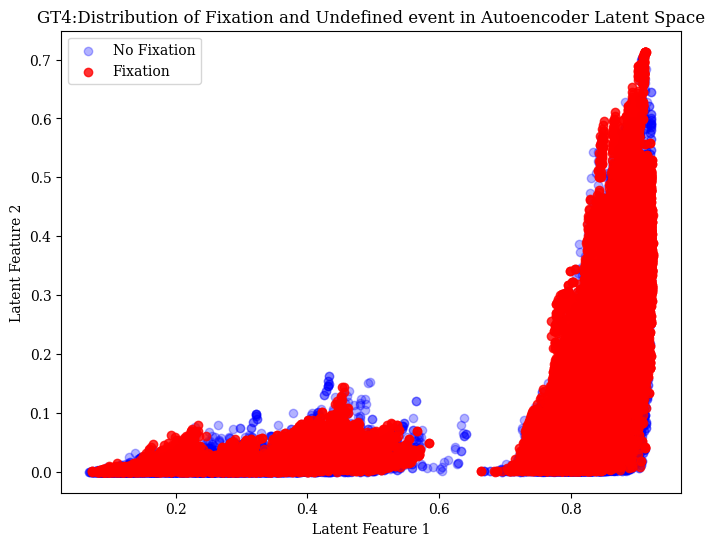

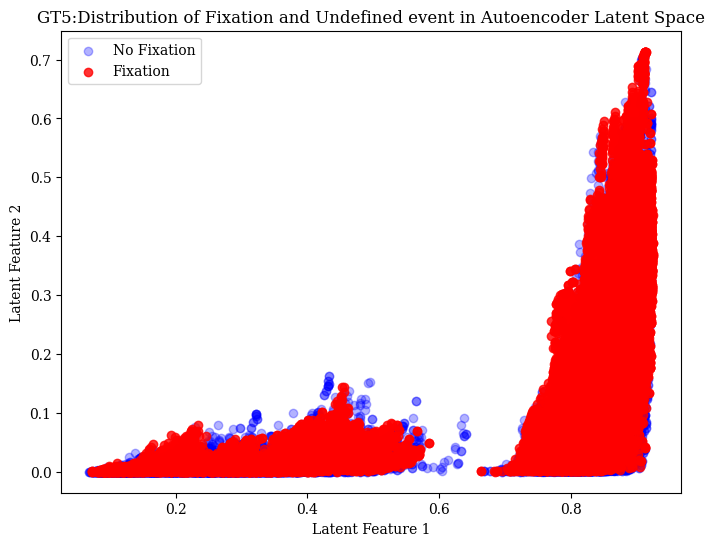

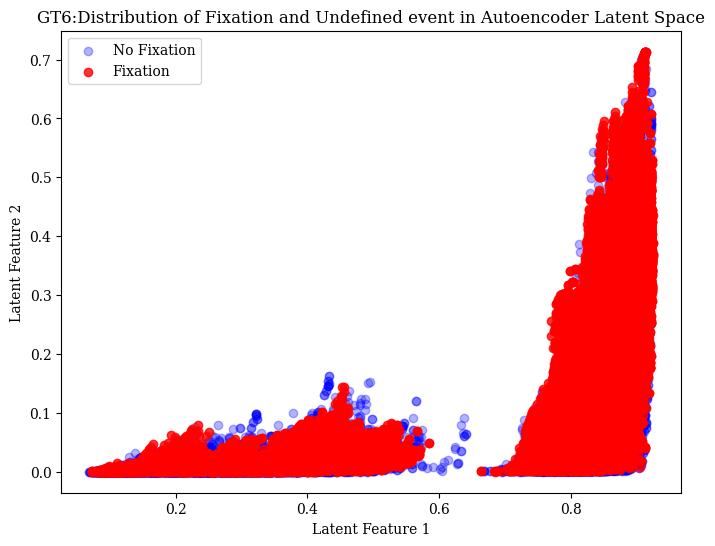

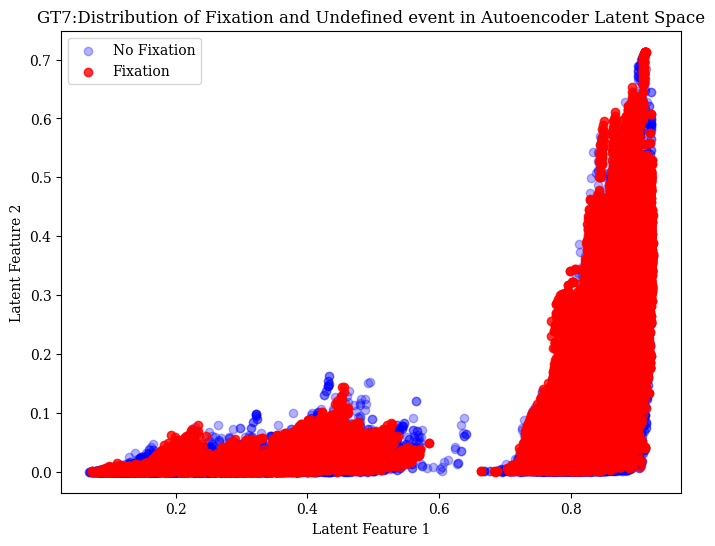

In [95]:
import matplotlib.pyplot as plt
import numpy as np

for i in range(1, 8):

    y_train_rf = gt_cols_dict_train_overlap[f'et_train_GT{i}_overlap'].values.ravel()
    y_train_rf = y_train_rf[:X_train_ae.shape[0]]  # Trim labels to match features

    # latent features from the autoencoder bottleneck
    latent_feature_1 = X_train_ae[:, 0]
    latent_feature_2 = X_train_ae[:, 1]

    fixation_labels = y_train_rf.flatten()  #  1D array

    plt.figure(figsize=(8, 6))

    fixation_points = np.where(fixation_labels == 1)
    no_fixation_points = np.where(fixation_labels == 0)


    plt.scatter(latent_feature_1[no_fixation_points], latent_feature_2[no_fixation_points],
                color='blue', label='No Fixation', alpha=0.3)
    plt.scatter(latent_feature_1[fixation_points], latent_feature_2[fixation_points],
                color='red', label='Fixation', alpha=0.8)

    plt.xlabel('Latent Feature 1')
    plt.ylabel('Latent Feature 2')
    plt.title(f'GT{i}:Distribution of Fixation and Undefined event in Autoencoder Latent Space')


    plt.legend()
    plt.savefig(f"GT{i}_Latent_Space_Plo_1_2.png")
    plt.show()

## Feature 2 x Feature 3

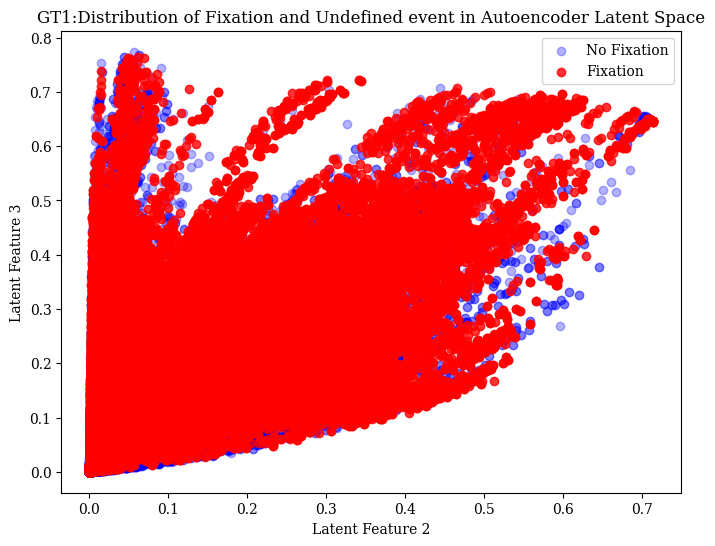

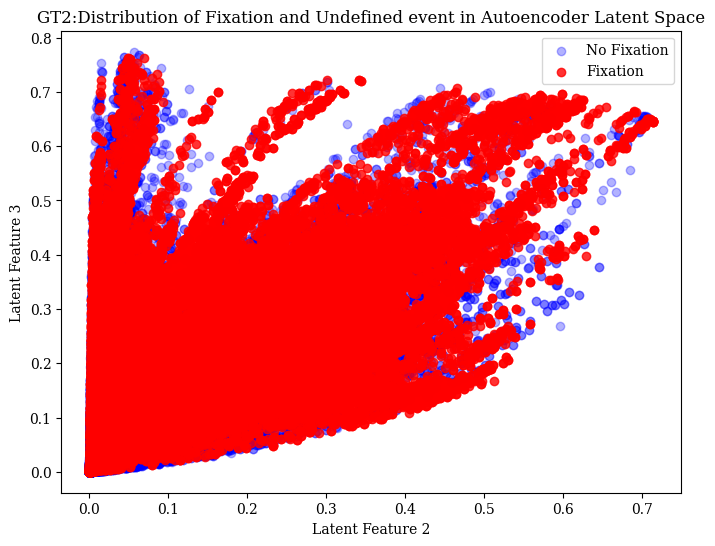

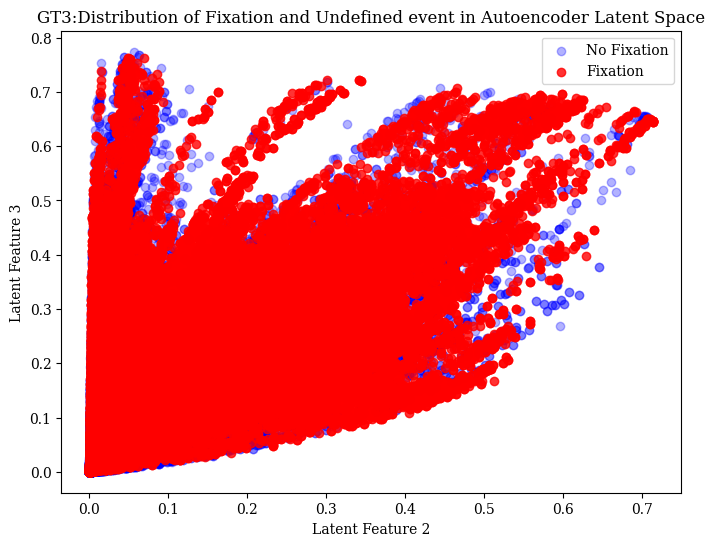

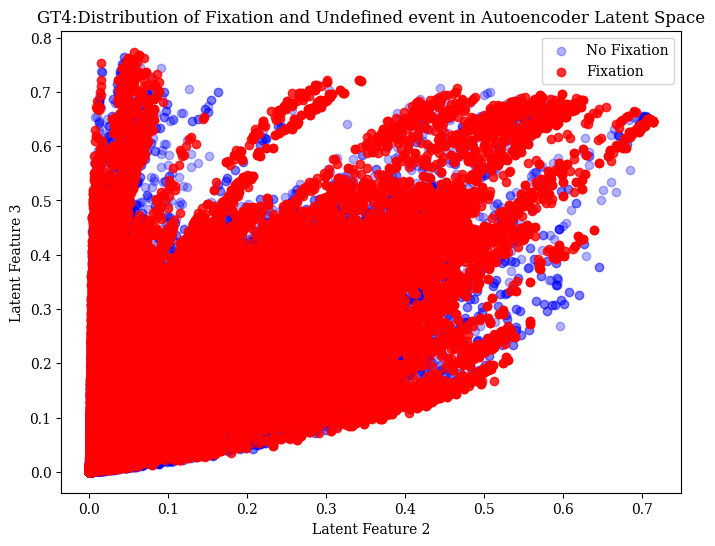

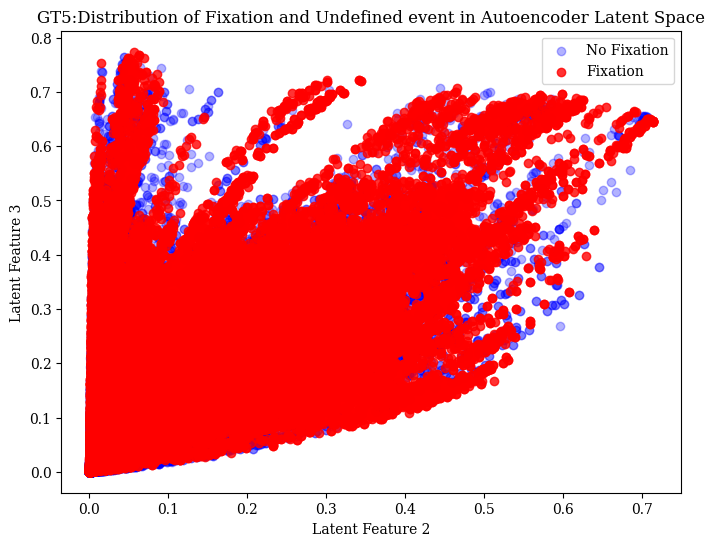

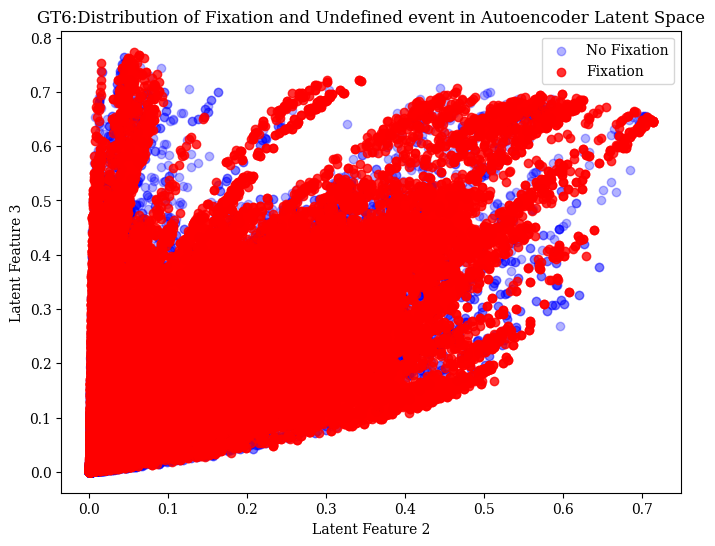

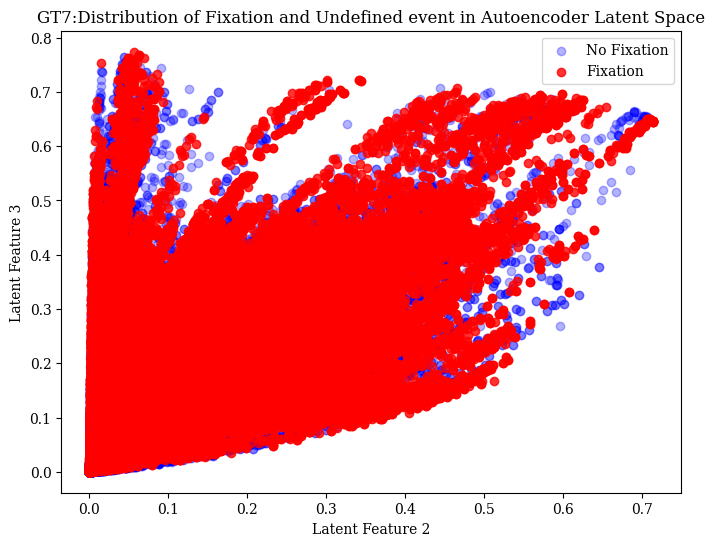

In [96]:
import matplotlib.pyplot as plt
import numpy as np

for i in range(1, 8):

    y_train_rf = gt_cols_dict_train_overlap[f'et_train_GT{i}_overlap'].values.ravel()
    y_train_rf = y_train_rf[:X_train_ae.shape[0]]  # Trim labels to match features

    # latent features from the autoencoder bottleneck
    latent_feature_2 = X_train_ae[:, 1]
    latent_feature_3 = X_train_ae[:, 2]

    fixation_labels = y_train_rf.flatten()  # 1D array

    plt.figure(figsize=(8, 6))

    # fixation_points = fixation_labels[fixation_labels.iloc[:, 0] == 1].index
    # no_fixation_points = fixation_labels[fixation_labels.iloc[:, 0] == 0].index

    fixation_points = np.where(fixation_labels == 1)
    no_fixation_points = np.where(fixation_labels == 0)

    plt.scatter(latent_feature_2[no_fixation_points], latent_feature_3[no_fixation_points],
                color='blue', label='No Fixation', alpha=0.3)
    plt.scatter(latent_feature_2[fixation_points], latent_feature_3[fixation_points],
                color='red', label='Fixation', alpha=0.8)

    plt.xlabel('Latent Feature 2')
    plt.ylabel('Latent Feature 3')
    plt.title(f'GT{i}:Distribution of Fixation and Undefined event in Autoencoder Latent Space')

    plt.legend()
    plt.savefig(f"GT{i}_Latent_Space_Plo_2_3.png")
    plt.show()

In [97]:
print(f"Shape of y_train_rf for GT{i}: {y_train_rf.shape}")


Shape of y_train_rf for GT7: (92416,)


# Feature 3 x Feature 1

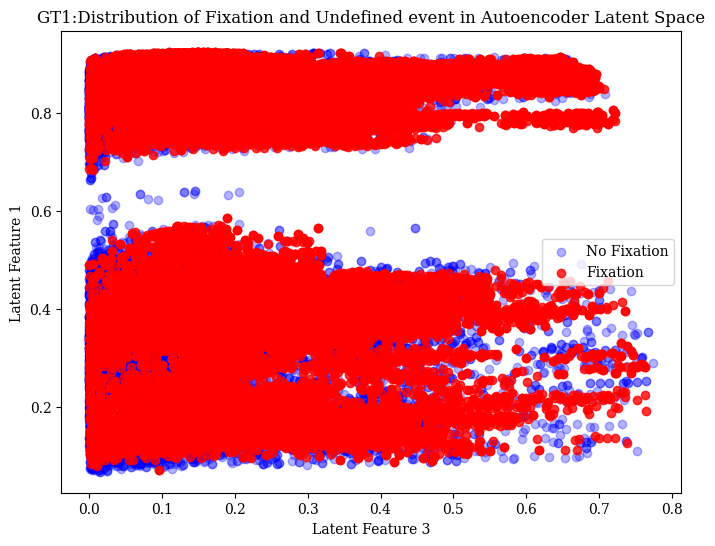

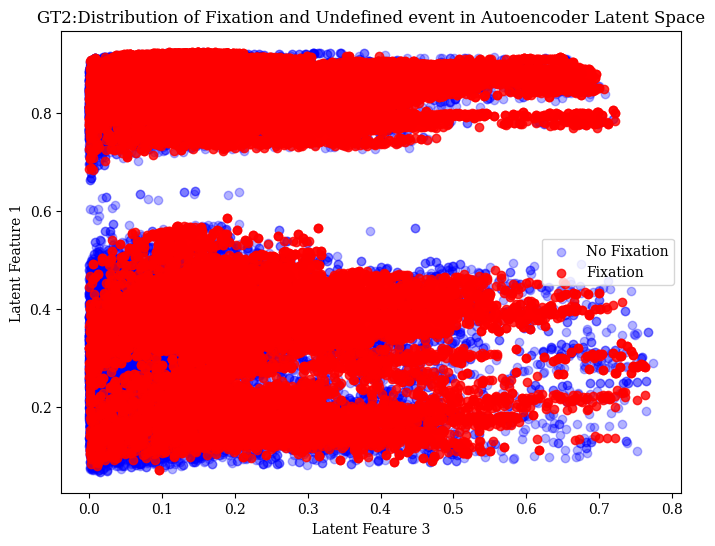

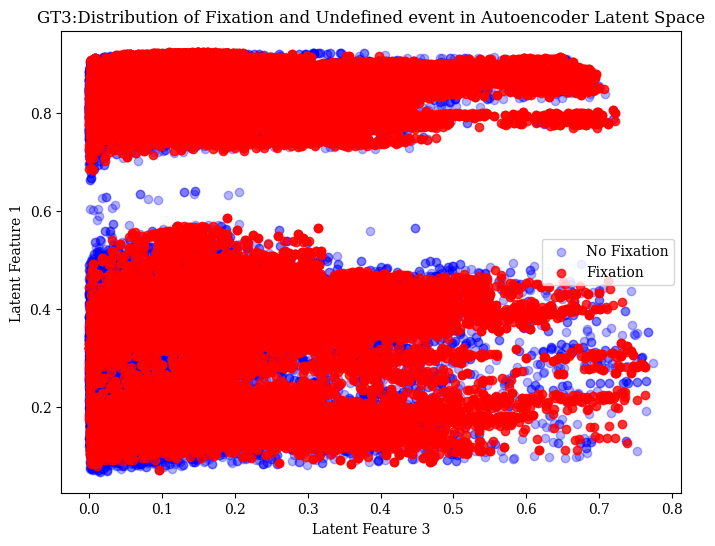

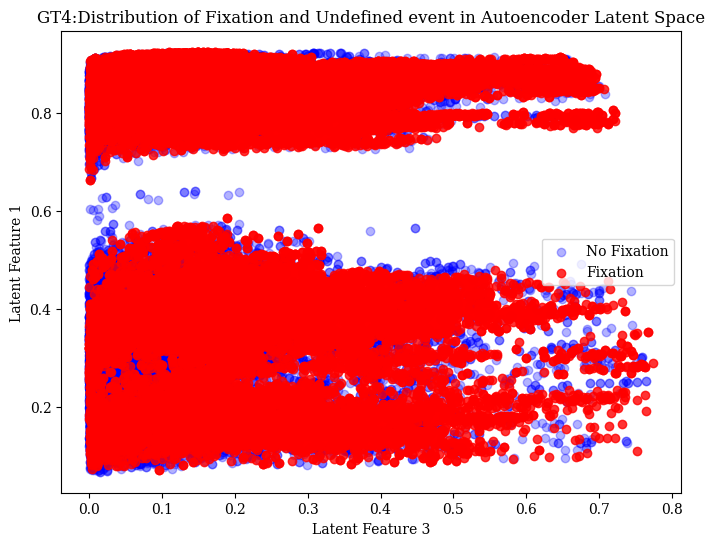

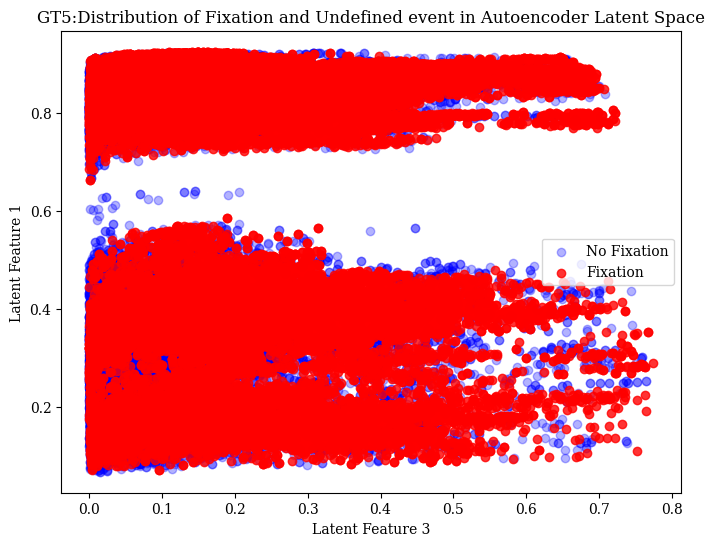

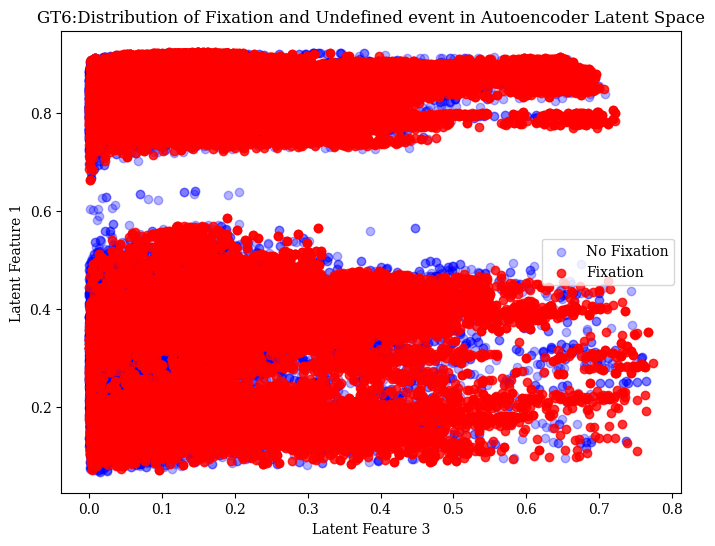

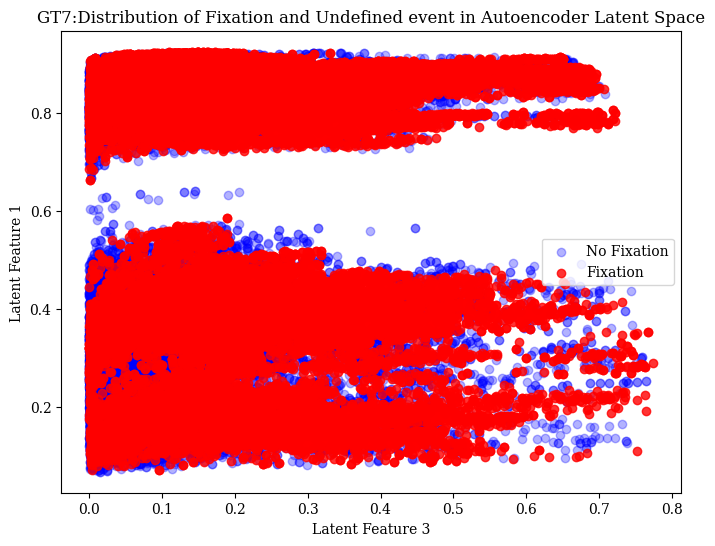

In [98]:
import matplotlib.pyplot as plt
import numpy as np

for i in range(1, 8):

    y_train_rf = gt_cols_dict_train_overlap[f'et_train_GT{i}_overlap'] #.values.ravel() # converts df to array (same plots as df or arrays)
    y_train_rf = y_train_rf[:X_train_ae.shape[0]]  # Trim labels to match features

    #  two latent features from the autoencoder bottleneck
    latent_feature_3 = X_train_ae[:, 2]
    latent_feature_1 = X_train_ae[:, 0]

    fixation_labels = y_train_rf

    plt.figure(figsize=(8, 6))

    fixation_points = fixation_labels[fixation_labels.iloc[:, 0] == 1].index
    no_fixation_points = fixation_labels[fixation_labels.iloc[:, 0] == 0].index

    plt.scatter(latent_feature_3[no_fixation_points], latent_feature_1[no_fixation_points],
                color='blue', label='No Fixation', alpha=0.3)
    plt.scatter(latent_feature_3[fixation_points], latent_feature_1[fixation_points],
                color='red', label='Fixation', alpha=0.8)

    plt.xlabel('Latent Feature 3')
    plt.ylabel('Latent Feature 1')
    plt.title(f'GT{i}:Distribution of Fixation and Undefined event in Autoencoder Latent Space')

    plt.legend()
    plt.savefig(f"GT{i}_Latent_Space_Plo_1_3.png")
    plt.show()

## OLD CODE

### REMOVE NORMALIZATION

# RANDOM FOREST

### TESTING THE MODEL:

In [ ]:
print(f"The X_train_ae_overlap shape is:  {X_train_ae_overlap.shape}")
print(f"The et_train_GT1_overlap shape is:  {et_train_GT1_overlap.shape}\n")
print(f"The X_test_ae_orig shape is:  {X_test_ae.shape}")
print(f"The et_test_GT1 shape is:  {et_test_GT1.shape}")

The X_train_ae_overlap shape is:  (108819, 2)
The et_train_GT1_overlap shape is:  (108819, 1)

The X_test_ae_orig shape is:  (26563, 2)
The et_test_GT1 shape is:  (26563, 1)


In [ ]:
np.savetxt("X_train_ae_overlap.csv", X_train_ae_overlap, delimiter=",")
np.savetxt("et_train_GT1_overlap.csv", et_train_GT1_overlap, delimiter=",")
np.savetxt("X_test_ae.csv", X_test_ae, delimiter=",")
np.savetxt("et_test_GT1.csv", et_test_GT1, delimiter=",")

In [ ]:
# Random Forest Classifier - USING OVERLAP X FROM ENCODER AND OVERLAP Y (LABELS) FOR TRAIN. USING ORIGINAL X FROM AUTOENCODER AND Y FOR TEST
rf = RandomForestClassifier(n_estimators=50, max_depth=12, n_jobs=-1)
rf.fit(X_train_ae_overlap, et_train_GT1_overlap.values.ravel()) # et_train_without_GT1_overlap  # #source: https://stackoverflow.com/questions/34165731/a-column-vector-y-was-passed-when-a-1d-array-was-expected

print(f'Train Accuracy: {rf.score(X_train_ae_overlap, et_train_GT1_overlap) * 100:.2f}%') #  et_train_without_GT1_overlap
print(f'Test Accuracy: {rf.score(X_test_ae, et_test_GT1) * 100:.2f}%') # et_test_without_GT1_no_overlap

Train Accuracy: 69.38%
Test Accuracy: 57.45%


## PLOTTING F1 X F2 FROM THE AUTOENCODER

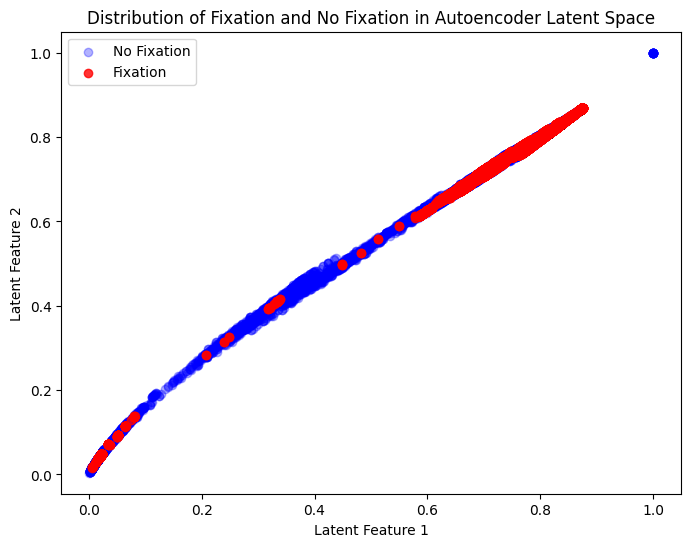

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract the two latent features from the autoencoder bottleneck
latent_feature_1 = X_train_ae_overlap[:, 0]
latent_feature_2 = X_train_ae_overlap[:, 1]

# Ground truth labels for fixation (1) and no fixation (0)
fixation_labels = et_train_GT1_overlap.values.flatten()  # Ensure it's a 1D array

# Create the scatter plot
plt.figure(figsize=(8, 6))

# Separate data points for fixation and no fixation
fixation_points = np.where(fixation_labels == 1)
no_fixation_points = np.where(fixation_labels == 0)

# Plot each category with a specific color and label

plt.scatter(latent_feature_1[no_fixation_points], latent_feature_2[no_fixation_points],
            color='blue', label='No Fixation', alpha=0.3)
plt.scatter(latent_feature_1[fixation_points], latent_feature_2[fixation_points],
            color='red', label='Fixation', alpha=0.8)

# Labels and title
plt.xlabel('Latent Feature 1')
plt.ylabel('Latent Feature 2')
plt.title('Distribution of Fixation and No Fixation in Autoencoder Latent Space')

# Add legend with colored dots
plt.legend()

# Show the plot
plt.show()

# EXPLAINING THE MODEL - LIME - LOCAL INTERPRETABLE MODEL-AGNOSTIC EXPLANATION

### Based on the LIME tutorial - tabular data:

https://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html

In [ ]:
!pip install lime -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=16d9c0185960f649a5c10e5423501a5e6c8600ab78b58d6d0e5f24adb4d5a1cf
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
import sklearn
import sklearn.datasets
import sklearn.ensemble
import numpy as np
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

In [ ]:
sklearn.metrics.accuracy_score(et_test_GT1, rf.predict(X_test_ae))

0.5904453563227046

In [ ]:
X_train_ae_overlap.shape

(108819, 2)

In [ ]:
X_test_ae.shape

(26563, 2)

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_ae_overlap,
    feature_names=["Latent Feature 1", "Latent Feature 2"],  # Adjusted for the 2 features from the autoencoder
    class_names=["Non-Fixation", "Fixation"],  # Class names for the 1 and 0 labels (1 for fixation, 0 for non-defined)
    mode="classification",  # We are doing classification (Fixation vs Non-Fixation)
    discretize_continuous=True  # This will discretize the continuous latent features
)



In [ ]:
# Choose an instance from the test set to explain
i = 0  # Example: Choose the first instance in the test set
exp = explainer.explain_instance(
    X_test_ae[i],  # Choose the corresponding test instance
    rf.predict_proba,  # Prediction probabilities function of your Random Forest model
    num_features=2  # We have 2 features to explain
)

In [ ]:
# Show explanation
exp.show_in_notebook(show_table=True, show_all=True)

In [ ]:
feature_names=["Latent Feature 1", "Latent Feature 2"]

In [ ]:
feature_index = lambda x: feature_names.index(x)

In [ ]:
X_test_ae

array([[0.17681137, 0.2430523 ],
       [0.49041238, 0.53055453],
       [0.6121043 , 0.63506401],
       ...,
       [1.        , 1.        ],
       [1.        , 1.        ],
       [1.        , 1.        ]])

In [ ]:
X_train_ae_overlap

array([[0.79994947, 0.79495418],
       [0.80001158, 0.79500991],
       [0.79997844, 0.79498231],
       ...,
       [1.        , 1.        ],
       [1.        , 1.        ],
       [1.        , 1.        ]])

In [ ]:
# Assuming the input instance is the first one in the test set (X_test_ae[i])

# Index for the latent features
feature_index = lambda x: ["Latent Feature 1", "Latent Feature 2"].index(x)

# Print information about increasing Latent Feature 1
print('\nIncreasing Latent Feature 1 - detect Fixation')
temp = X_test_ae[i].copy()
print('P(Fixation) before:', round(rf.predict_proba(temp.reshape(1,-1))[0, 1],4))  # Before changing Latent Feature 1
temp[feature_index('Latent Feature 1')] = min(temp[feature_index('Latent Feature 1')] + 0.1, 1.0)  # Increase by 0.1, min function guarantee it will not be bigger than 1, since data is normilized
print('P(Fixation) after:', round(rf.predict_proba(temp.reshape(1,-1))[0, 1],4))  # After changing Latent Feature 1
print()


# Print information about increasing Latent Feature 1
print('Increasing Latent Feature 1 - detect Non Fixation')
temp = X_test_ae[i].copy()
print('P(Non Fixation) before:', round(rf.predict_proba(temp.reshape(1,-1))[0, 0],4))  # Before changing Latent Feature 1
temp[feature_index('Latent Feature 1')] = min(temp[feature_index('Latent Feature 1')] + 0.1, 1.0)  # Increase by 0.1, min function guarantee it will not be bigger than 1, since data is normilized
print('P(Non Fixation) after:', round(rf.predict_proba(temp.reshape(1,-1))[0, 0],4))  # After changing Latent Feature 1
print()

# Print information about increasing Latent Feature 2
print('Increasing Latent Feature 2 - Detect Fixation')
temp = X_test_ae[i].copy()
print('P(Fixation) before:', round(rf.predict_proba(temp.reshape(1,-1))[0, 1],4))  # Before changing Latent Feature 2
temp[feature_index('Latent Feature 2')] = min(temp[feature_index('Latent Feature 2')] + 0.1, 1.0)  # Increase by 0.1, but cap it at 1
print('P(Fixation) after:', round(rf.predict_proba(temp.reshape(1,-1))[0, 1],4))  # After changing Latent Feature 2
print()

# Print information about increasing Latent Feature 2
print('Increasing Latent Feature 2 - detect Non Fixation')
temp = X_test_ae[i].copy()
print('P(Non Fixation) before:', round(rf.predict_proba(temp.reshape(1,-1))[0, 0],4))  # Before changing Latent Feature 2
temp[feature_index('Latent Feature 2')] = min(temp[feature_index('Latent Feature 2')] + 0.1, 1.0)  # Increase by 0.1, but cap it at 1
print('P(Non Fixation) after:', round(rf.predict_proba(temp.reshape(1,-1))[0, 0],4))  # After changing Latent Feature 2
print()


# Print information about increasing both features
print('Increasing both Latent Features - detect Fixation')
temp = X_test_ae[i].copy()
print('P(Fixation) before:', round(rf.predict_proba(temp.reshape(1,-1))[0, 1],4))  # Before changing both features
temp[feature_index('Latent Feature 1')] = min(temp[feature_index('Latent Feature 1')] + 0.1, 1.0)  # Increase by 0.1, but cap it at 1
temp[feature_index('Latent Feature 2')] = min(temp[feature_index('Latent Feature 2')] + 0.1, 1.0)  # Increase by 0.1, but cap it at 1
print('P(Fixation) after:', round(rf.predict_proba(temp.reshape(1,-1))[0, 1],4))  # After changing both features


# Print information about increasing both features
print('\nIncreasing both Latent Features - detect Non Fixation')
temp = X_test_ae[i].copy()
print('P(Non Fixation) before:', round(rf.predict_proba(temp.reshape(1,-1))[0, 0],4))  # Before changing both features
temp[feature_index('Latent Feature 1')] = min(temp[feature_index('Latent Feature 1')] + 0.1, 1.0)  # Increase by 0.1, but cap it at 1
temp[feature_index('Latent Feature 2')] = min(temp[feature_index('Latent Feature 2')] + 0.1, 1.0)  # Increase by 0.1, but cap it at 1
print('P(Non Fixation) after:', round(rf.predict_proba(temp.reshape(1,-1))[0, 0],4))  # After changing both features



# Index for the latent features
feature_index = lambda x: ["Latent Feature 1", "Latent Feature 2"].index(x)





Increasing Latent Feature 1 - detect Fixation
P(Fixation) before: 0.0002
P(Fixation) after: 0.0126

Increasing Latent Feature 1 - detect Non Fixation
P(Non Fixation) before: 0.9998
P(Non Fixation) after: 0.9874

Increasing Latent Feature 2 - Detect Fixation
P(Fixation) before: 0.0002
P(Fixation) after: 0.0043

Increasing Latent Feature 2 - detect Non Fixation
P(Non Fixation) before: 0.9998
P(Non Fixation) after: 0.9957

Increasing both Latent Features - detect Fixation
P(Fixation) before: 0.0002
P(Fixation) after: 0.0

Increasing both Latent Features - detect Non Fixation
P(Non Fixation) before: 0.9998
P(Non Fixation) after: 1.0


In [ ]:
exp.show_in_notebook(show_table=True, show_all=True, show_predicted_value=True)

###Based on the LIME tutorial - pytorch (used for images):